In [1]:
import pathlib as Path
import pandas as pd
import os

import glob

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [2]:
files = glob.glob("/data/kelpschdj/iNDI/Production/outputs/run_20260803_124616_6otz/organelle_features/*_organelle_features_*.parquet")

parts = []
for f in files:
    part = pd.read_parquet(f)
    parts.append(part)
    print(f"{os.path.basename(f)}: {len(part)} rows")

df = pd.concat(parts, ignore_index=True)

print(f"\nLoaded {len(files)} files, {len(df)} total rows")
print(df.head())
print(df.columns.tolist())

028ebee9-afaf-4ff8-b435-af11714285dc_organelle_features__20260803_171522.parquet: 116923 rows
07fc5da6-9d7d-4c97-858b-4b76df1859a5_organelle_features__20260803_171522.parquet: 115825 rows
2350e82d-40dd-4bb4-93de-44edec0d1718_organelle_features__20260803_171522.parquet: 138260 rows
2b1c31ad-579d-4ea6-a782-251ea083ed6a_organelle_features__20260803_171522.parquet: 206401 rows
2da14033-ab86-4f33-b4f7-ef375c80ce62_organelle_features__20260803_171522.parquet: 166866 rows
32d75d22-bd17-4629-8257-a4056e3ffcee_organelle_features__20260803_171522.parquet: 107047 rows
4405a3b2-6b88-49b1-91f3-992e09ccbd16_organelle_features__20260803_171522.parquet: 131613 rows
51cf625a-9422-406f-aa9e-a9f1238d1b96_organelle_features__20260803_171522.parquet: 177584 rows
72c0a713-b5d5-4cd4-a826-c556368ed1d1_organelle_features__20260803_171522.parquet: 100661 rows
7e03b502-ad64-4090-a9e2-fc4c3ecdae11_organelle_features__20260803_171522.parquet: 169399 rows
934f6de5-f58b-4a1e-b225-ac6414500bb7_organelle_features__202

In [3]:
## pull in metadata
plate_id_fn = "/data/CARDPB2/iNDI/Production/metadata/indi_plateID_to_folderID.csv"
plate_id = pd.read_csv(plate_id_fn)
print(plate_id.head())

automated_plates_fn = "/data/CARDPB2/iNDI/Production/metadata/all_automated_plates_combined.csv"
manual_plates_fn = "/data/CARDPB2/iNDI/Production/metadata/all_manual_plates_combined.csv"
automated_plate_md = pd.read_csv(automated_plates_fn)
manual_plates_md = pd.read_csv(manual_plates_fn)

print(automated_plate_md.head())
print(manual_plates_md.head())

auto_cols = automated_plate_md.columns.tolist()
man_cols = manual_plates_md.columns.tolist()

print("Only in automated:", [c for c in auto_cols if c not in man_cols])
print("Only in manual:   ", [c for c in man_cols if c not in auto_cols])

  iNDI_Plate_ID    Layout                             Folder_ID
0    INDI00002D  Plate002  2b1c31ad-579d-4ea6-a782-251ea083ed6a
1    INDI00007D  Plate007  d7e04b5c-a253-42ff-859f-2af0e6047a00
2    INDI00011D  Plate011  f8062781-891b-4688-a59e-fccbf48325cf
3    INDI00015D  Plate015  caef83c7-6b44-4b64-b8ec-e8d84ca6759d
4    INDI00019D  Plate019  c8f2dbbe-6632-4063-ab68-0b4fa37909af
  iNDI_Plate_ID Well_ID      Genotype_Name       JAX_ID Batch_Info  \
0    INDI00026D     A01  HNRNPA1 D262N HOM  JIPSC001038        NaN   
1    INDI00026D     A02  HNRNPA1 D262N HOM  JIPSC001038        NaN   
2    INDI00026D     A03  HNRNPA1 D262N REV  JIPSC001042        NaN   
3    INDI00026D     A04  HNRNPA1 D262N HOM  JIPSC001038        NaN   
4    INDI00026D     A05      PFN1 C71G HET  JIPSC001034        NaN   

      JAX_Code     Gene Variant Genotype          Gene_Var_Type  \
0  JIPSC001038  HNRNPA1   D262N  SNV/SNV  HNRNPA1_D262N_SNV/SNV   
1  JIPSC001038  HNRNPA1   D262N  SNV/SNV  HNRNPA1_D262N_SNV/S

In [4]:
# label each source before combining
automated_plate_md = automated_plate_md.copy()
manual_plates_md = manual_plates_md.copy()
automated_plate_md["prep_method"] = "automated"
manual_plates_md["prep_method"] = "manual"

# make sure the manual df uses the same column order
manual_plates_md = manual_plates_md.reindex(columns=automated_plate_md.columns)

# append rows
all_plates_md = pd.concat([automated_plate_md, manual_plates_md], ignore_index=True)

print(all_plates_md.columns.tolist())
print(all_plates_md.shape)
print(all_plates_md["prep_method"].value_counts())
print(df.columns.tolist())

['iNDI_Plate_ID', 'Well_ID', 'Genotype_Name', 'JAX_ID', 'Batch_Info', 'JAX_Code', 'Gene', 'Variant', 'Genotype', 'Gene_Var_Type', 'Cell_Line_Info', 'prep_method']
(8064, 12)
prep_method
automated    4992
manual       3072
Name: count, dtype: int64
['Measurement_ID', 'subdirectory', 'Row', 'Column', 'Frame', 'Plane', 'Time', 'DAPI_filename', 'channel_filename', 'Structure', 'Stain', 'Nucleus_ID', 'area_px', 'organelle_count', 'average_organelle_area', 'roi_occupancy', 'max_f_intensity', 'sum_f_intensity', 'mean_f_intensity', 'median_f_intensity', 'CoefOfVar_intensity', 'area_mean', 'area_median', 'area_std', 'area_p10', 'area_p90', 'perimeter_mean', 'perimeter_median', 'perimeter_std', 'perimeter_p10', 'perimeter_p90', 'eccentricity_mean', 'eccentricity_median', 'eccentricity_std', 'eccentricity_p10', 'eccentricity_p90', 'solidity_mean', 'solidity_median', 'solidity_std', 'solidity_p10', 'solidity_p90', 'extent_mean', 'extent_median', 'extent_std', 'extent_p10', 'extent_p90', 'axis_majo

In [5]:
print("df Measurement_ID sample:", df["Measurement_ID"].head(3).tolist())
print("plate_id Folder_ID sample:", plate_id["Folder_ID"].head(3).tolist())
print("df dtype:", df["Measurement_ID"].dtype, "| plate_id dtype:", plate_id["Folder_ID"].dtype)

# keep only the mapping columns you need
plate_id_map = plate_id[["Folder_ID", "iNDI_Plate_ID", "Layout"]].drop_duplicates("Folder_ID")

# optional: remove columns in df that would collide
df = df.drop(columns=["Folder_ID", "iNDI_Plate_ID", "Layout"], errors="ignore")

print("Folder_ID unique?", plate_id_map["Folder_ID"].is_unique)
print("Folder_IDs in plate_id:", plate_id_map["Folder_ID"].nunique())

df_ids = set(df["Measurement_ID"].unique())
map_ids = set(plate_id_map["Folder_ID"].unique())
print(f"df experiments: {len(df_ids)} | matched in map: {len(df_ids & map_ids)} | unmatched: {len(df_ids - map_ids)}")

df = df.merge(
    plate_id_map,
    left_on="Measurement_ID",
    right_on="Folder_ID",
    how="left",
    validate="many_to_one",
    suffixes=("", "")  # no overlap now, so no _x/_y
)

print(f"After merge: {len(df)} rows")
print(df.columns.tolist())

df Measurement_ID sample: ['028ebee9-afaf-4ff8-b435-af11714285dc', '028ebee9-afaf-4ff8-b435-af11714285dc', '028ebee9-afaf-4ff8-b435-af11714285dc']
plate_id Folder_ID sample: ['2b1c31ad-579d-4ea6-a782-251ea083ed6a', 'd7e04b5c-a253-42ff-859f-2af0e6047a00', 'f8062781-891b-4688-a59e-fccbf48325cf']
df dtype: object | plate_id dtype: object
Folder_ID unique? True
Folder_IDs in plate_id: 22
df experiments: 21 | matched in map: 21 | unmatched: 0
After merge: 2963636 rows
['Measurement_ID', 'subdirectory', 'Row', 'Column', 'Frame', 'Plane', 'Time', 'DAPI_filename', 'channel_filename', 'Structure', 'Stain', 'Nucleus_ID', 'area_px', 'organelle_count', 'average_organelle_area', 'roi_occupancy', 'max_f_intensity', 'sum_f_intensity', 'mean_f_intensity', 'median_f_intensity', 'CoefOfVar_intensity', 'area_mean', 'area_median', 'area_std', 'area_p10', 'area_p90', 'perimeter_mean', 'perimeter_median', 'perimeter_std', 'perimeter_p10', 'perimeter_p90', 'eccentricity_mean', 'eccentricity_median', 'eccentr

In [6]:
# build Well_ID
import string
df["Well_ID"] = df.apply(
    lambda r: f"{string.ascii_uppercase[int(r['Row'])-1]}{int(r['Column']):02d}",
    axis=1,
)

# match-rate on the FULL composite key
df_keys = set(zip(df["iNDI_Plate_ID"], df["Well_ID"]))
md_keys = set(zip(all_plates_md["iNDI_Plate_ID"], all_plates_md["Well_ID"]))
print(f"df keys: {len(df_keys)} | matched: {len(df_keys & md_keys)} | unmatched: {len(df_keys - md_keys)}")

# metadata composite key unique?
print("md plate+well unique?",
      not all_plates_md.duplicated(["iNDI_Plate_ID", "Well_ID"]).any())

df = df.merge(
    all_plates_md,
    on=["iNDI_Plate_ID", "Well_ID"],
    how="left",
    validate="many_to_one",
)
print(f"After merge: {len(df)} rows")   # should be unchanged
print(df.columns.tolist())

df keys: 6352 | matched: 6352 | unmatched: 0
md plate+well unique? True
After merge: 2963636 rows
['Measurement_ID', 'subdirectory', 'Row', 'Column', 'Frame', 'Plane', 'Time', 'DAPI_filename', 'channel_filename', 'Structure', 'Stain', 'Nucleus_ID', 'area_px', 'organelle_count', 'average_organelle_area', 'roi_occupancy', 'max_f_intensity', 'sum_f_intensity', 'mean_f_intensity', 'median_f_intensity', 'CoefOfVar_intensity', 'area_mean', 'area_median', 'area_std', 'area_p10', 'area_p90', 'perimeter_mean', 'perimeter_median', 'perimeter_std', 'perimeter_p10', 'perimeter_p90', 'eccentricity_mean', 'eccentricity_median', 'eccentricity_std', 'eccentricity_p10', 'eccentricity_p90', 'solidity_mean', 'solidity_median', 'solidity_std', 'solidity_p10', 'solidity_p90', 'extent_mean', 'extent_median', 'extent_std', 'extent_p10', 'extent_p90', 'axis_major_length_mean', 'axis_major_length_median', 'axis_major_length_std', 'axis_major_length_p10', 'axis_major_length_p90', 'axis_minor_length_mean', 'axis

In [7]:
for plate, grp in df.groupby('iNDI_Plate_ID'):
    print(f"\n{plate}")
    print(grp.groupby('Genotype_Name')['Well_ID'].nunique())


INDI00002D
Genotype_Name
FUS R459X HET    48
FUS R459X HOM    48
FUS R459X REV    48
Parental         96
VCP R159H HET    48
VCP R159H HOM    48
VCP R159H REV    48
Name: Well_ID, dtype: int64

INDI00007D
Genotype_Name
Parental            96
TARDBP M337V HET    48
TARDBP M337V REV    48
TARDBP Q331K HOM    47
TIA1 P351L HOM      48
TIA1 P351L REV      48
Name: Well_ID, dtype: int64

INDI00011D
Genotype_Name
FUS R216C HOM      47
PSEN2 N141I HOM    48
PSEN2 N141I REV    47
Parental           96
TBK1 E696K HET      2
TBK1 E696K HOM      4
TBK1 E696K REV      3
Name: Well_ID, dtype: int64

INDI00015D
Genotype_Name
APP A673T HET      48
APP A673T REV      48
APP E693G HET      48
APP E693G HOM      48
APP V717I HOM      48
PSEN1 E276A HET    48
Parental           48
Name: Well_ID, dtype: int64

INDI00019D
Genotype_Name
APP E693G REV      41
FUS R216C HET      47
FUS R216C REV      47
PSEN1 E276A HOM     4
PSEN1 E276A REV    47
PSEN2 N141I HET     2
Parental           95
Name: Well_ID, dty

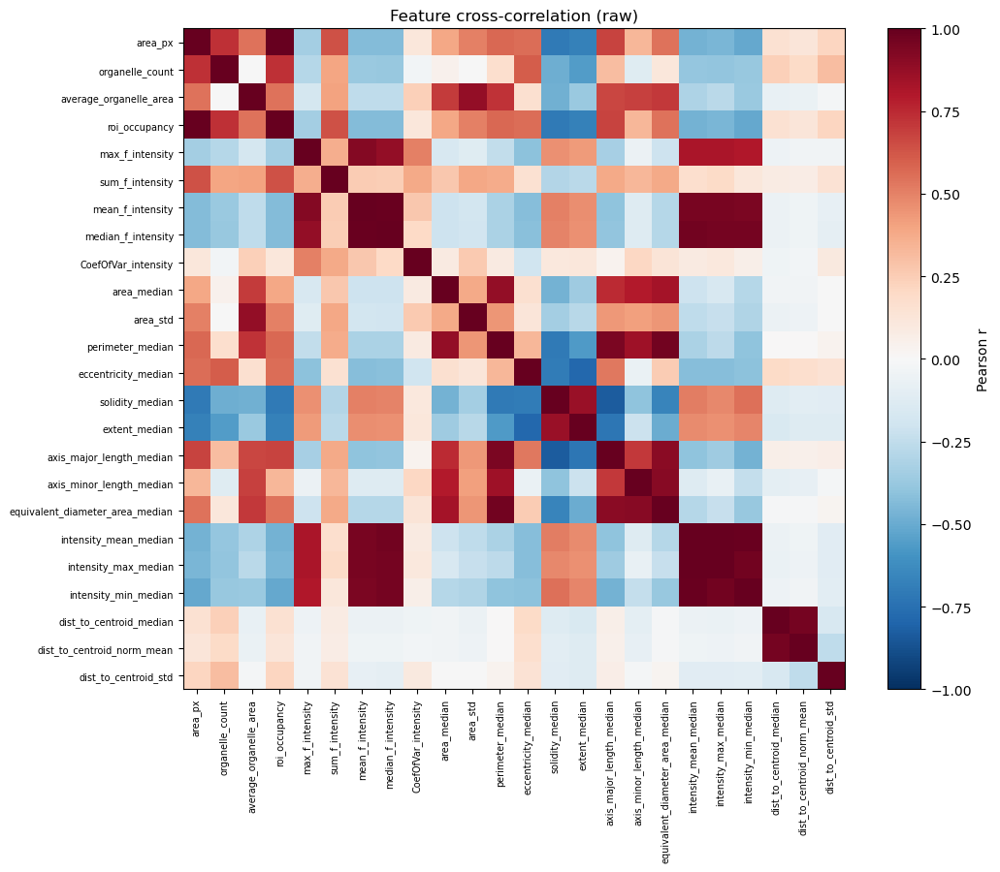

Highly correlated pairs (|r| > 0.9):
  +0.993  intensity_mean_median            intensity_max_median
  +0.992  mean_f_intensity                 median_f_intensity
  +0.988  intensity_mean_median            intensity_min_median
  +0.968  intensity_max_median             intensity_min_median
  +0.966  median_f_intensity               intensity_mean_median
  +0.966  perimeter_median                 equivalent_diameter_area_median
  +0.959  median_f_intensity               intensity_max_median
  +0.958  median_f_intensity               intensity_min_median
  +0.956  dist_to_centroid_median          dist_to_centroid_norm_mean
  +0.952  mean_f_intensity                 intensity_mean_median
  +0.945  mean_f_intensity                 intensity_max_median
  +0.945  mean_f_intensity                 intensity_min_median
  +0.940  perimeter_median                 axis_major_length_median
  +0.921  max_f_intensity                  mean_f_intensity
  +0.907  axis_minor_length_median         equival

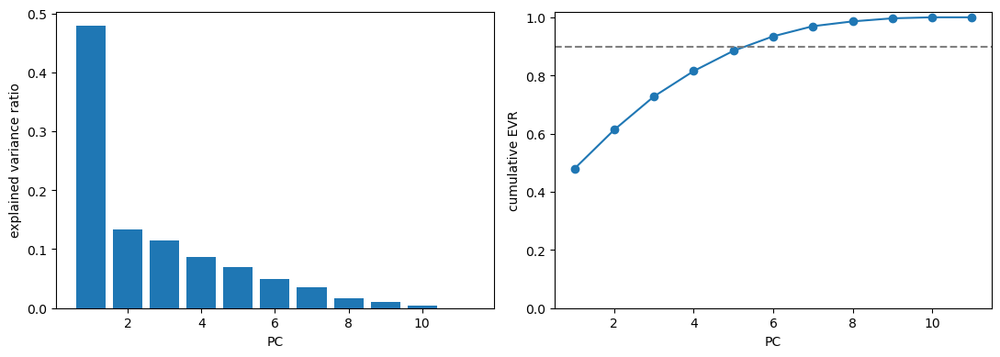

EVR: [0.479 0.134 0.115 0.087 0.07  0.05  0.035 0.016 0.011 0.003 0.   ]
cumulative: [0.479 0.613 0.728 0.815 0.885 0.935 0.969 0.986 0.997 1.    1.   ]
                              PC1    PC2    PC3    PC4    PC5    PC6
area_px                     0.382  0.265  0.064  0.120 -0.048 -0.370
organelle_count             0.336  0.206  0.048 -0.052  0.413 -0.293
roi_occupancy               0.382  0.265  0.064  0.120 -0.048 -0.370
mean_f_intensity           -0.298  0.447  0.298 -0.328 -0.066 -0.016
CoefOfVar_intensity        -0.042  0.572  0.021  0.595 -0.256  0.418
eccentricity_median         0.345 -0.063  0.127 -0.346 -0.030  0.333
solidity_median            -0.372  0.026 -0.087  0.160  0.349 -0.202
extent_median              -0.375  0.010 -0.121  0.244  0.270 -0.287
intensity_max_median       -0.300  0.363  0.302 -0.436 -0.054 -0.126
dist_to_centroid_norm_mean  0.072 -0.123  0.688  0.237  0.543  0.289
dist_to_centroid_std        0.104  0.371 -0.545 -0.236  0.511  0.363


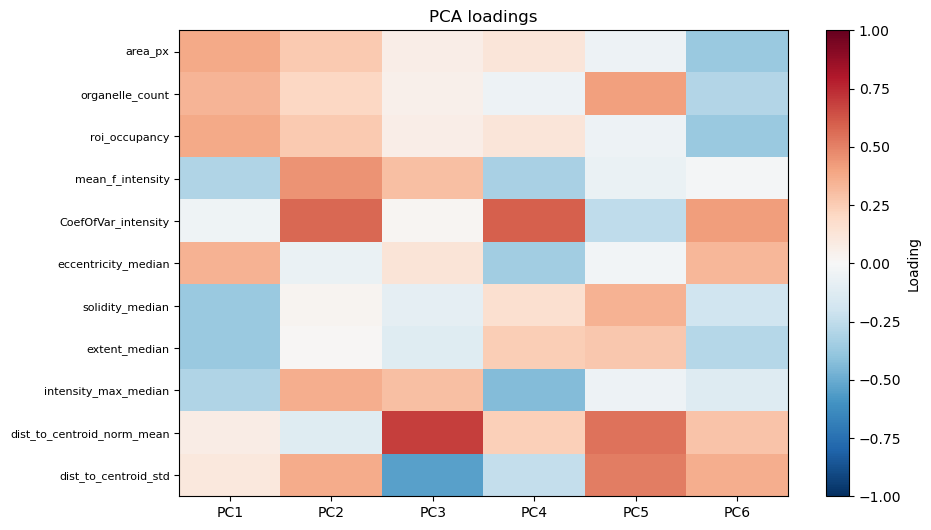

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# ---------------------------------------------------------------
# STEP 0 — pick the candidate feature set (start WIDE, prune from corr)
# ---------------------------------------------------------------
# All the per-ROI numeric features worth considering. Prune AFTER seeing corr.
CANDIDATE_FEATURES = [
    # ROI-level
    "area_px", "organelle_count", "average_organelle_area", "roi_occupancy",
    # pooled-pixel intensity
    "max_f_intensity", "sum_f_intensity", "mean_f_intensity",
    "median_f_intensity", "CoefOfVar_intensity",
    # per-object shape (use median as the robust center; add _std for spread)
    "area_median", "area_std",
    "perimeter_median", "eccentricity_median", "solidity_median",
    "extent_median", "axis_major_length_median", "axis_minor_length_median",
    "equivalent_diameter_area_median",
    # per-object intensity distribution
    "intensity_mean_median", "intensity_max_median", "intensity_min_median",
    # radial organization
    "dist_to_centroid_median", "dist_to_centroid_norm_mean", "dist_to_centroid_std",
]
# keep only columns that actually exist (panel/version differences)
CANDIDATE_FEATURES = [c for c in CANDIDATE_FEATURES if c in df.columns]

# ---------------------------------------------------------------
# STEP 1 — cross-correlation (on raw, pre-scaling features)
# ---------------------------------------------------------------
X_all = df[CANDIDATE_FEATURES].replace([np.inf, -np.inf], np.nan)
corr = X_all.corr(method="pearson")

plt.figure(figsize=(11, 9))
im = plt.imshow(corr, cmap="RdBu_r", vmin=-1, vmax=1)
plt.xticks(range(len(CANDIDATE_FEATURES)), CANDIDATE_FEATURES, rotation=90, fontsize=7)
plt.yticks(range(len(CANDIDATE_FEATURES)), CANDIDATE_FEATURES, fontsize=7)
plt.colorbar(im, label="Pearson r")
plt.title("Feature cross-correlation (raw)")
plt.tight_layout(); plt.show()

# Highly correlated pairs
hi = (corr.abs() > 0.9) & (corr.abs() < 1.0)
pairs = [
    (a, b, round(corr.loc[a, b], 3))
    for i, a in enumerate(CANDIDATE_FEATURES)
    for b in CANDIDATE_FEATURES[i + 1:]
    if hi.loc[a, b]
]
print("Highly correlated pairs (|r| > 0.9):")
for a, b, r in sorted(pairs, key=lambda t: -abs(t[2])):
    print(f"  {r:+.3f}  {a:32s} {b}")

# ---------------------------------------------------------------
# STEP 2 — pruned FEATURES list
# ---------------------------------------------------------------
FEATURES = [
    "area_px", "organelle_count", "roi_occupancy",
    "mean_f_intensity", "CoefOfVar_intensity",
    "eccentricity_median", "solidity_median", "extent_median",
    "intensity_max_median",
    "dist_to_centroid_norm_mean", "dist_to_centroid_std",
]
FEATURES = [c for c in FEATURES if c in df.columns]

# drop the arithmetic identities explicitly (documented, not silent):
#   average_organelle_area = area_px / organelle_count
#   sum_f_intensity        = mean_f_intensity * area_px
#   equivalent_diameter_area_* is monotone in area_*

# ---------------------------------------------------------------
# STEP 3 — NaN/inf handling (empty ROIs -> NaN intensity/CV/dist)
# ---------------------------------------------------------------
before = len(df)
X_df = df[FEATURES].replace([np.inf, -np.inf], np.nan)
keep = X_df.notna().all(axis=1)
df = df[keep].reset_index(drop=True)
X_df = X_df[keep].reset_index(drop=True)
print(f"Dropped {before - len(df)} rows with NaN/inf; {len(df)} remain")

# ---------------------------------------------------------------
# STEP 4 — scale + PCA
# ---------------------------------------------------------------
X = StandardScaler().fit_transform(X_df.values)
pca = PCA(n_components=len(FEATURES))
scores = pca.fit_transform(X)
for i in range(scores.shape[1]): 
    df[f"PC{i+1}"] = scores[:, i]

# ---------------------------------------------------------------
# STEP 5 — scree
# ---------------------------------------------------------------
ev = pca.explained_variance_ratio_
fig, ax = plt.subplots(1, 2, figsize=(11, 4))
ax[0].bar(range(1, len(ev) + 1), ev)
ax[0].set_xlabel("PC"); ax[0].set_ylabel("explained variance ratio")
ax[1].plot(range(1, len(ev) + 1), np.cumsum(ev), marker="o")
ax[1].axhline(0.9, ls="--", c="gray"); ax[1].set_xlabel("PC")
ax[1].set_ylabel("cumulative EVR"); ax[1].set_ylim(0, 1.02)
plt.tight_layout(); plt.show()
print("EVR:", ev.round(3))
print("cumulative:", np.cumsum(ev).round(3))

# ---------------------------------------------------------------
# STEP 6 — loadings
# ---------------------------------------------------------------
n_show = min(6, len(FEATURES))
loadings = pd.DataFrame(
    pca.components_.T, index=FEATURES,
    columns=[f"PC{i+1}" for i in range(len(FEATURES))],
)
print(loadings.iloc[:, :n_show].round(3))

plt.figure(figsize=(1.6 * n_show, 0.4 * len(FEATURES) + 1))
im = plt.imshow(loadings.iloc[:, :n_show], cmap="RdBu_r", vmin=-1, vmax=1, aspect="auto")
plt.xticks(range(n_show), [f"PC{i+1}" for i in range(n_show)])
plt.yticks(range(len(FEATURES)), FEATURES, fontsize=8)
plt.colorbar(im, label="Loading")
plt.title("PCA loadings")
plt.tight_layout(); plt.show()

Variance in each PC explained by Structure (η²):
  PC1: 0.788
  PC2: 0.035
  PC3: 0.050
  PC4: 0.150
  PC5: 0.088
  PC6: 0.011
  PC7: 0.186
  PC8: 0.006
  PC9: 0.024
  PC10: 0.014
  PC11: 0.175


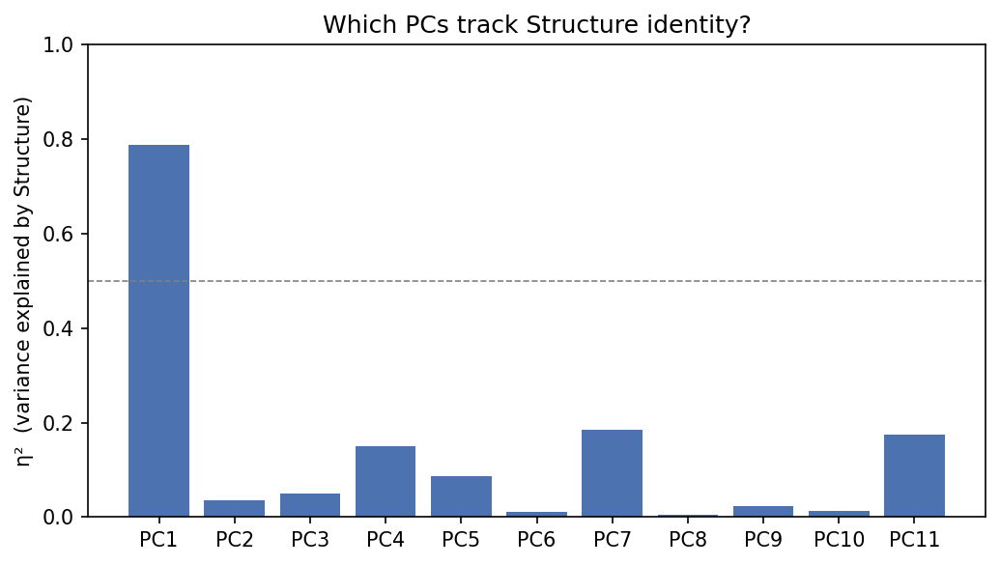

In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def eta_squared(values, groups):
    """Fraction of variance in `values` explained by categorical `groups`.
    η² = SS_between / SS_total (one-way)."""
    values = np.asarray(values, dtype=float)
    grand_mean = values.mean()
    ss_total = ((values - grand_mean) ** 2).sum()
    ss_between = 0.0
    for g in pd.unique(groups):
        v = values[groups == g]
        ss_between += len(v) * (v.mean() - grand_mean) ** 2
    return ss_between / ss_total if ss_total > 0 else np.nan

pc_cols = [c for c in df.columns if c.startswith("PC")]
groups = df["Structure"].to_numpy()

eta = pd.Series(
    {pc: eta_squared(df[pc].to_numpy(), groups) for pc in pc_cols},
    name="eta_sq",
).sort_index(key=lambda s: s.str.lstrip("PC").astype(int))

print("Variance in each PC explained by Structure (η²):")
for pc, v in eta.items():
    print(f"  {pc}: {v:.3f}")

# bar plot
fig, ax = plt.subplots(figsize=(7, 4), dpi=150)
ax.bar(range(len(eta)), eta.values, color="#4c72b0")
ax.set_xticks(range(len(eta)))
ax.set_xticklabels(eta.index, rotation=0)
ax.set_ylabel("η²  (variance explained by Structure)")
ax.set_ylim(0, 1)
ax.axhline(0.5, ls="--", c="gray", lw=0.8)
ax.set_title("Which PCs track Structure identity?")
plt.tight_layout(); plt.show()

Variance in each PC explained by prep_method (η²):
  PC1: 0.011
  PC2: 0.007
  PC3: 0.003
  PC4: 0.019
  PC5: 0.001
  PC6: 0.004
  PC7: 0.006
  PC8: 0.001
  PC9: 0.007
  PC10: 0.000
  PC11: 0.000


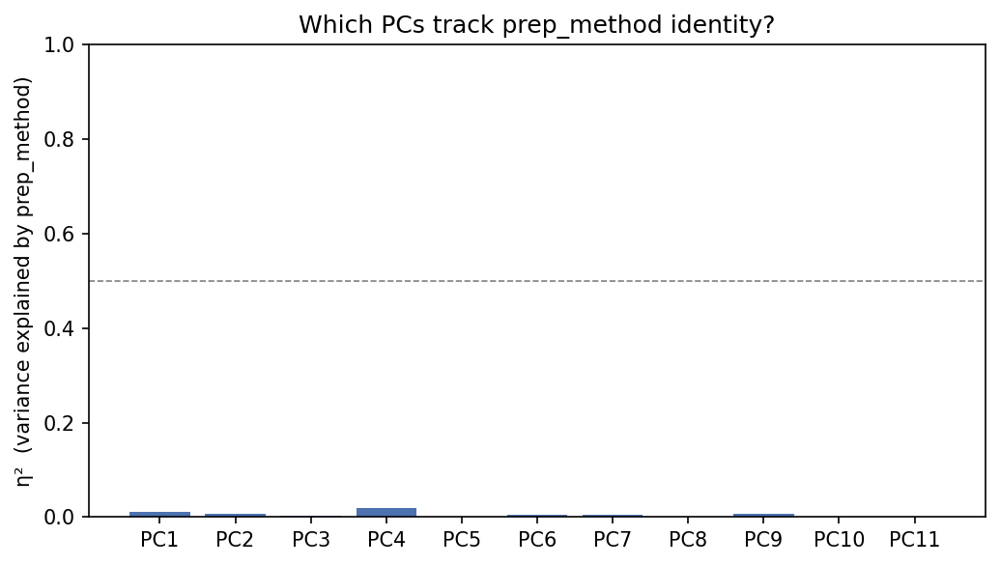

In [10]:
pc_cols = [c for c in df.columns if c.startswith("PC")]
groups = df["prep_method"].to_numpy()

eta = pd.Series(
    {pc: eta_squared(df[pc].to_numpy(), groups) for pc in pc_cols},
    name="eta_sq",
).sort_index(key=lambda s: s.str.lstrip("PC").astype(int))

print("Variance in each PC explained by prep_method (η²):")
for pc, v in eta.items():
    print(f"  {pc}: {v:.3f}")

# bar plot
fig, ax = plt.subplots(figsize=(7, 4), dpi=150)
ax.bar(range(len(eta)), eta.values, color="#4c72b0")
ax.set_xticks(range(len(eta)))
ax.set_xticklabels(eta.index, rotation=0)
ax.set_ylabel("η²  (variance explained by prep_method)")
ax.set_ylim(0, 1)
ax.axhline(0.5, ls="--", c="gray", lw=0.8)
ax.set_title("Which PCs track prep_method identity?")
plt.tight_layout(); plt.show()

Variance in each PC explained by iNDI_Plate_ID (η²):
  PC1: 0.019
  PC2: 0.077
  PC3: 0.021
  PC4: 0.038
  PC5: 0.017
  PC6: 0.015
  PC7: 0.018
  PC8: 0.003
  PC9: 0.013
  PC10: 0.005
  PC11: 0.006


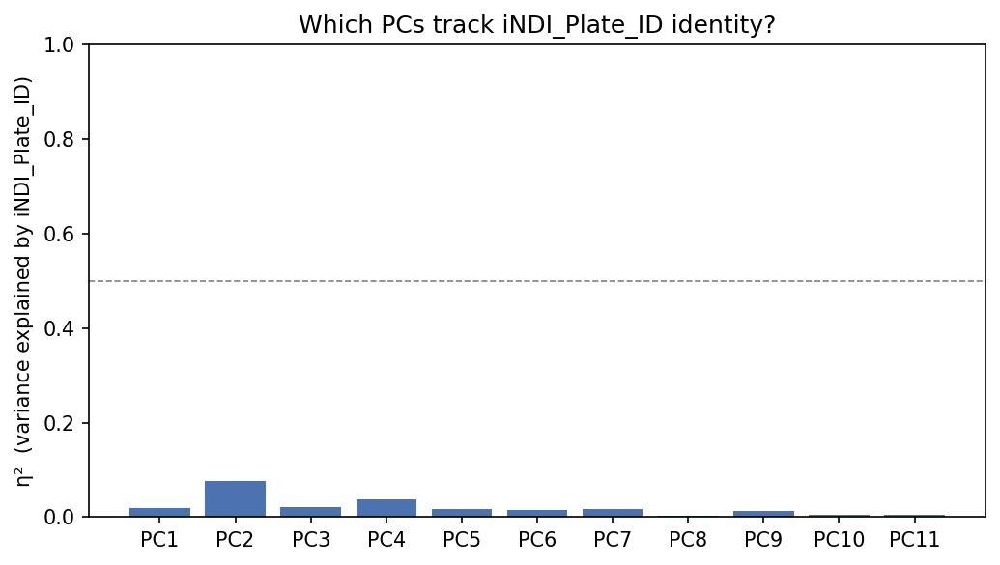

In [11]:
pc_cols = [c for c in df.columns if c.startswith("PC")]
groups = df["iNDI_Plate_ID"].to_numpy()

eta = pd.Series(
    {pc: eta_squared(df[pc].to_numpy(), groups) for pc in pc_cols},
    name="eta_sq",
).sort_index(key=lambda s: s.str.lstrip("PC").astype(int))

print("Variance in each PC explained by iNDI_Plate_ID (η²):")
for pc, v in eta.items():
    print(f"  {pc}: {v:.3f}")

# bar plot
fig, ax = plt.subplots(figsize=(7, 4), dpi=150)
ax.bar(range(len(eta)), eta.values, color="#4c72b0")
ax.set_xticks(range(len(eta)))
ax.set_xticklabels(eta.index, rotation=0)
ax.set_ylabel("η²  (variance explained by iNDI_Plate_ID)")
ax.set_ylim(0, 1)
ax.axhline(0.5, ls="--", c="gray", lw=0.8)
ax.set_title("Which PCs track iNDI_Plate_ID identity?")
plt.tight_layout(); plt.show()

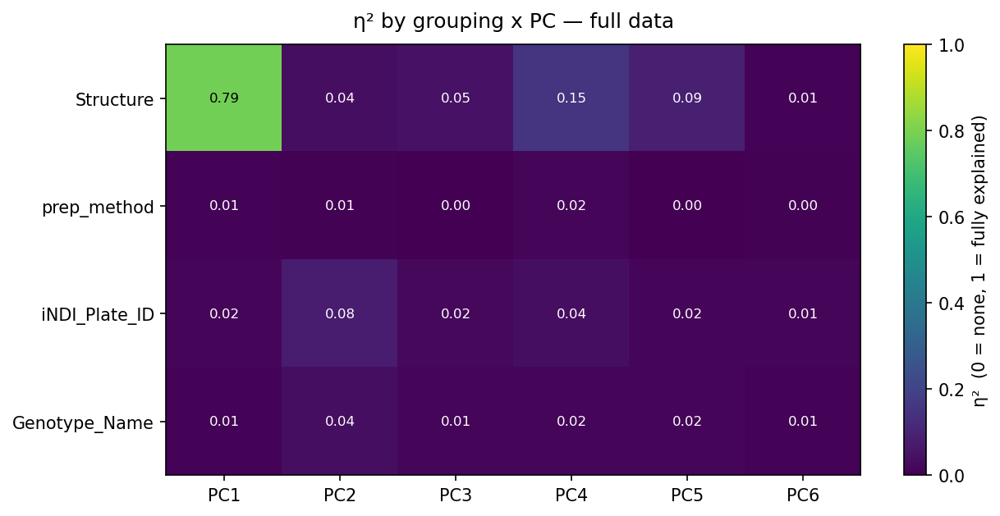

In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def eta_squared(values, groups):
    """Fraction of variance in `values` explained by categorical `groups`.
    η² = SS_between / SS_total (one-way)."""
    values = np.asarray(values, dtype=float)
    mask = np.isfinite(values)                 # guard against NaN/inf in a PC
    values, groups = values[mask], np.asarray(groups)[mask]
    if values.size == 0:
        return np.nan
    grand_mean = values.mean()
    ss_total = ((values - grand_mean) ** 2).sum()
    ss_between = 0.0
    for g in pd.unique(groups):
        v = values[groups == g]
        ss_between += len(v) * (v.mean() - grand_mean) ** 2
    return ss_between / ss_total if ss_total > 0 else np.nan


def eta_heatmap(data, group_cols, pc_cols=None, n_pcs=None,
                title="η²: variance in each PC explained by grouping",
                figsize=None, annot=True):
    """Heatmap of η² for each (grouping variable x PC).

    data       : dataframe with PC columns + the grouping columns
    group_cols : list of categorical column names (rows of the heatmap)
    n_pcs      : limit to first N PCs (default: all present)
    """
    if pc_cols is None:
        pc_cols = sorted(
            [c for c in data.columns if c.startswith("PC")],
            key=lambda s: int(s[2:]),
        )
    if n_pcs is not None:
        pc_cols = pc_cols[:n_pcs]

    # build the η² matrix: rows = grouping vars, cols = PCs
    mat = pd.DataFrame(index=group_cols, columns=pc_cols, dtype=float)
    for gc in group_cols:
        if gc not in data.columns:
            print(f"[warning] grouping column '{gc}' not in data; skipping.")
            continue
        groups = data[gc].to_numpy()
        for pc in pc_cols:
            mat.loc[gc, pc] = eta_squared(data[pc].to_numpy(), groups)

    # plot
    if figsize is None:
        figsize = (1.1 * len(pc_cols) + 2, 0.7 * len(group_cols) + 1.5)
    fig, ax = plt.subplots(figsize=figsize, dpi=150)
    im = ax.imshow(mat.values.astype(float), cmap="viridis", vmin=0, vmax=1,
                   aspect="auto")
    ax.set_xticks(range(len(pc_cols)))
    ax.set_xticklabels(pc_cols)
    ax.set_yticks(range(len(group_cols)))
    ax.set_yticklabels(group_cols)
    plt.colorbar(im, ax=ax, label="η²  (0 = none, 1 = fully explained)")
    ax.set_title(title, pad=10)

    if annot:
        for i in range(len(group_cols)):
            for j in range(len(pc_cols)):
                v = mat.iloc[i, j]
                if pd.notna(v):
                    ax.text(j, i, f"{v:.2f}", ha="center", va="center",
                            color="white" if v < 0.6 else "black", fontsize=8)
    plt.tight_layout(); plt.show()
    return mat


GROUP_COLS = ["Structure", "prep_method", "iNDI_Plate_ID", "Genotype_Name"]

# --- full (pooled) data ---
eta_full = eta_heatmap(df, GROUP_COLS, n_pcs=6,
                       title="η² by grouping x PC — full data")

All 21 plates in df have a palette color.


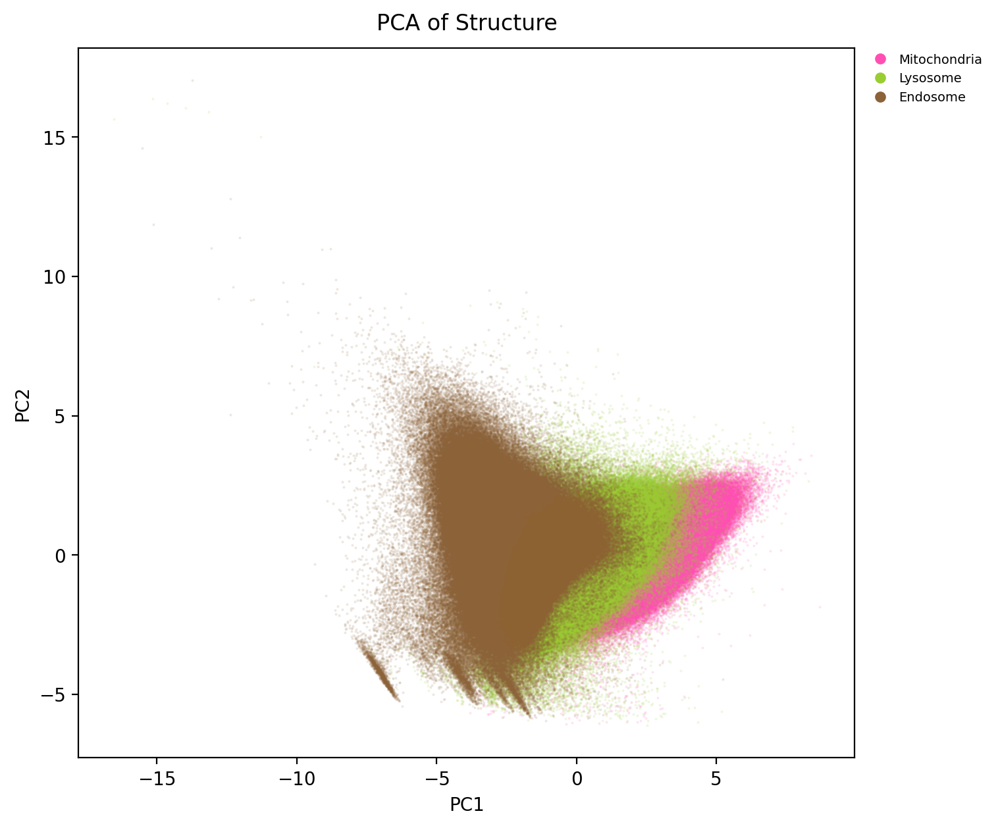

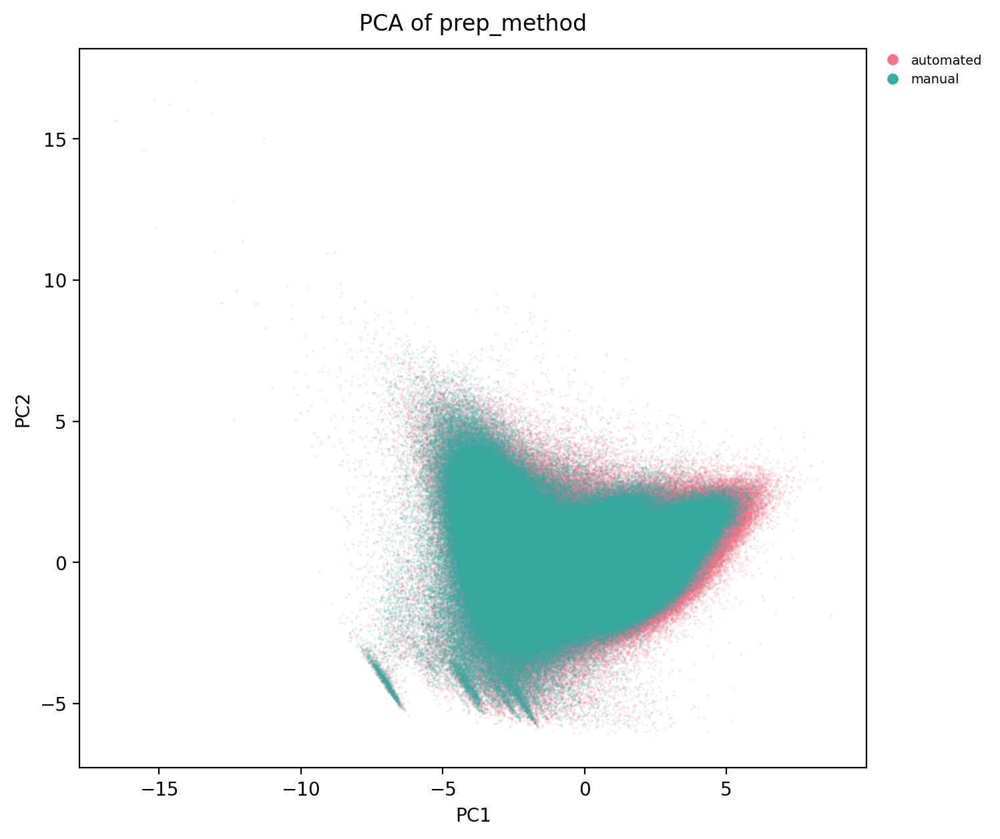

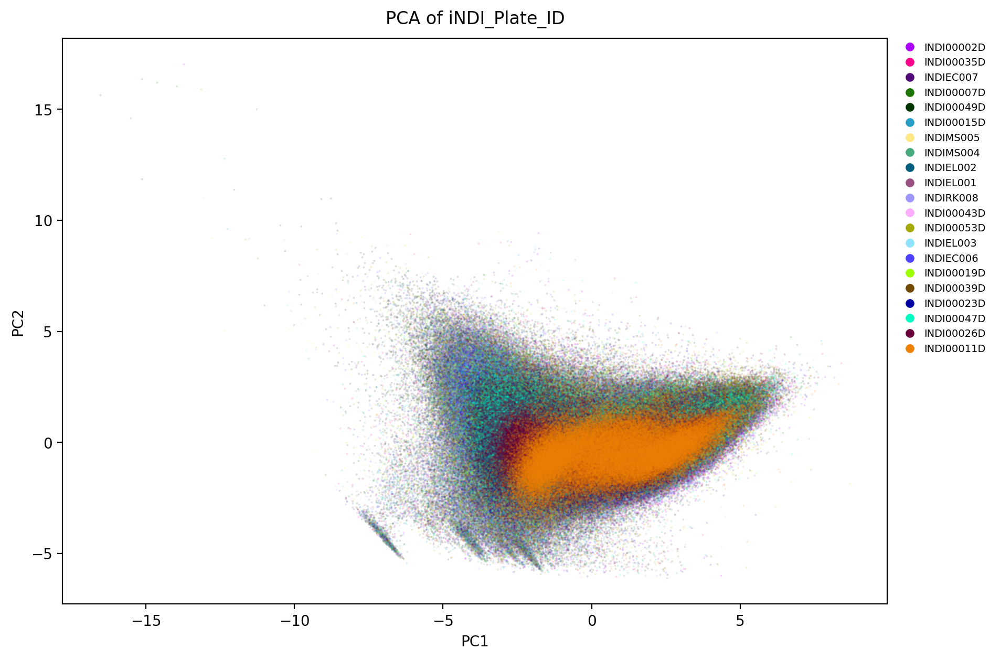

[warning] 70 genotypes > 64 colors; some will repeat.


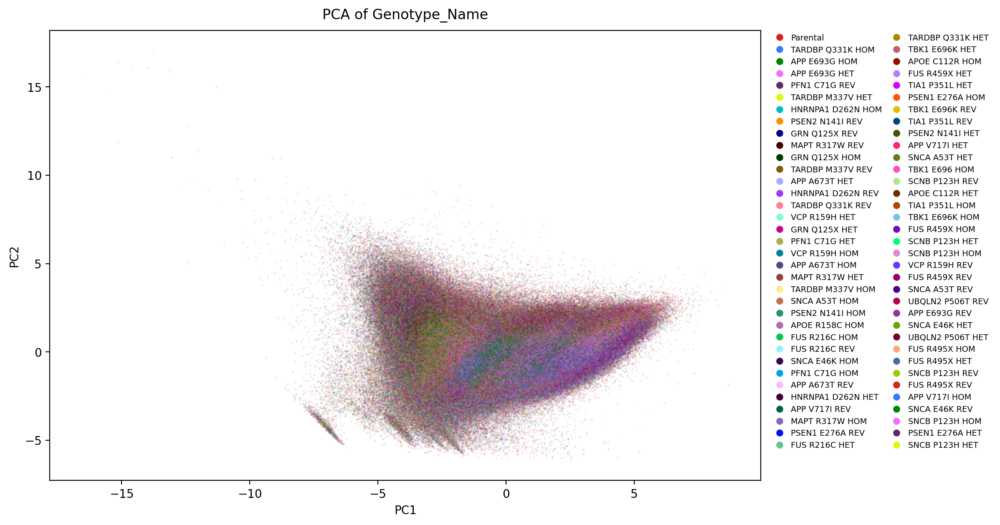

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.colors import ListedColormap
import seaborn as sns
import glasbey

STRUCTURE_COLORS = {
    "Golgi":        "#e6a817",
    "Endosome":     "#8c6239",
    "Lysosome":     "#9acd32",
    "Mitochondria": "#ff4fb3",
}

# --- colleague's plate palette (fixed plate_id -> color) ---
plate_palette_raw = glasbey.create_palette(
    palette_size=21, hue_bounds=(60, 500.0), chroma_bounds=(40, 130)
)
glasbey_cmap_plates = ListedColormap(plate_palette_raw)
colors_plates = [glasbey_cmap_plates(i) for i in range(len(plate_palette_raw))]

unique_plate_ids = [
    'INDI00002D', 'INDI00007D', 'INDI00011D', 'INDI00015D', 'INDI00019D',
    'INDI00023D', 'INDI00026D', 'INDI00035D', 'INDI00039D', 'INDI00043D',
    'INDI00047D', 'INDI00049D', 'INDI00053D', 'INDIEC006', 'INDIEC007',
    'INDIEL001', 'INDIEL002', 'INDIEL003', 'INDIMS004', 'INDIMS005', 'INDIRK008',
]
plate_palette = {pid: colors_plates[i] for i, pid in enumerate(unique_plate_ids)}

# glasbey palette for genotypes (high-cardinality, no fixed mapping)
geno_palette_raw = glasbey.create_palette(
    palette_size=64, hue_bounds=(0.0, 360.0), chroma_bounds=(40, 90)
)
geno_cmap = ListedColormap(geno_palette_raw)
geno_colors = [geno_cmap(i) for i in range(len(geno_palette_raw))]


def pca_scatter(
    df,
    color_col,
    pcx="PC1",
    pcy="PC2",
    palette=None,
    s=2,
    alpha=0.15,
    figsize=(10, 7),
    legend_ncol=1,
    title=None,
    show_legend=True,
):
    fig, ax = plt.subplots(figsize=figsize, dpi=200)
    fig.subplots_adjust(right=0.78)

    vals = df[color_col].astype("object")
    cats = vals.value_counts().index.tolist()   # freq-ordered, ALL categories

    # choose colors
    if palette is not None:
        colors = [palette.get(c, "#808080") for c in cats]
    elif color_col == "Structure":
        colors = [STRUCTURE_COLORS.get(c, "#808080") for c in cats]
    elif color_col == "Genotype_Name":
        if len(cats) > len(geno_colors):
            print(f"[warning] {len(cats)} genotypes > {len(geno_colors)} "
                  f"colors; some will repeat.")
        colors = [geno_colors[i % len(geno_colors)] for i in range(len(cats))]
    else:
        colors = sns.color_palette("husl", n_colors=len(cats))

    for c, col in zip(cats, colors):
        m = vals == c
        ax.scatter(
            df.loc[m, pcx], df.loc[m, pcy],
            s=s, alpha=alpha, color=col, linewidths=0, rasterized=True,
        )

    ax.set_xlabel(pcx)
    ax.set_ylabel(pcy)
    ax.set_title(title or f"PCA of {color_col}", pad=10)

    if show_legend:
        handles = [
            Line2D([0], [0], marker="o", linestyle="", markersize=5,
                   markerfacecolor=col, markeredgecolor=col, alpha=1.0, label=str(c))
            for c, col in zip(cats, colors)
        ]
        ax.legend(
            handles=handles, loc="upper left", bbox_to_anchor=(1.01, 1.0),
            frameon=False, fontsize=7, ncol=legend_ncol,
            borderaxespad=0.0, handletextpad=0.4, columnspacing=0.8,
        )
    plt.show()


# --- guard: plates in data with no palette color ---
plates_in_data = set(df["iNDI_Plate_ID"].dropna().unique())
missing = plates_in_data - set(plate_palette)
if missing:
    print(f"[warning] {len(missing)} plate(s) with NO palette color "
          f"(render gray): {sorted(missing)}")
else:
    print(f"All {len(plates_in_data)} plates in df have a palette color.")

df_shuf = df.sample(frac=1, random_state=0).reset_index(drop=True)

pca_scatter(df_shuf, "Structure", palette=STRUCTURE_COLORS,
            figsize=(9, 7), title="PCA of Structure")
pca_scatter(df_shuf, "prep_method",
            figsize=(9, 7), title="PCA of prep_method")
pca_scatter(df_shuf, "iNDI_Plate_ID", palette=plate_palette,
            figsize=(12, 7), title="PCA of iNDI_Plate_ID")
pca_scatter(df_shuf, "Genotype_Name",
            figsize=(13, 7), legend_ncol=2, title="PCA of Genotype_Name")

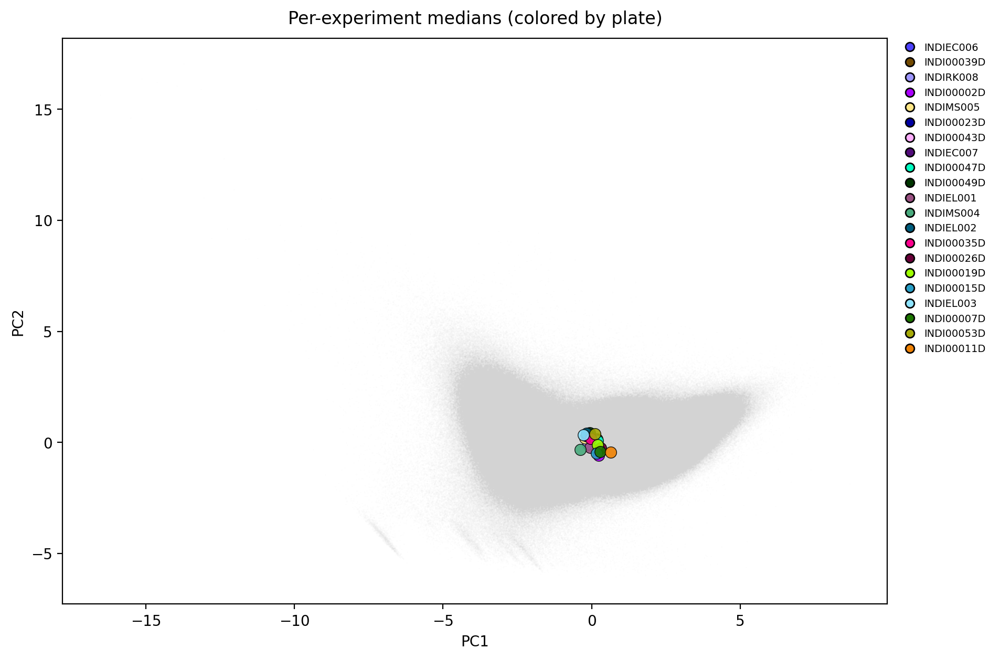

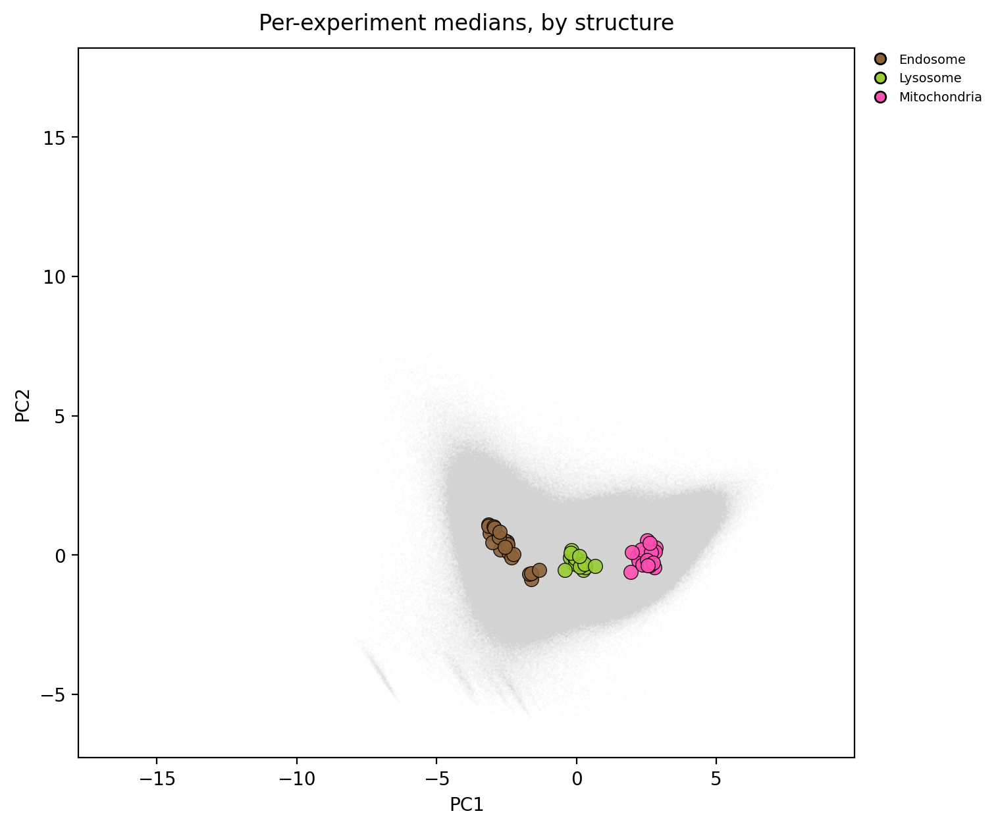

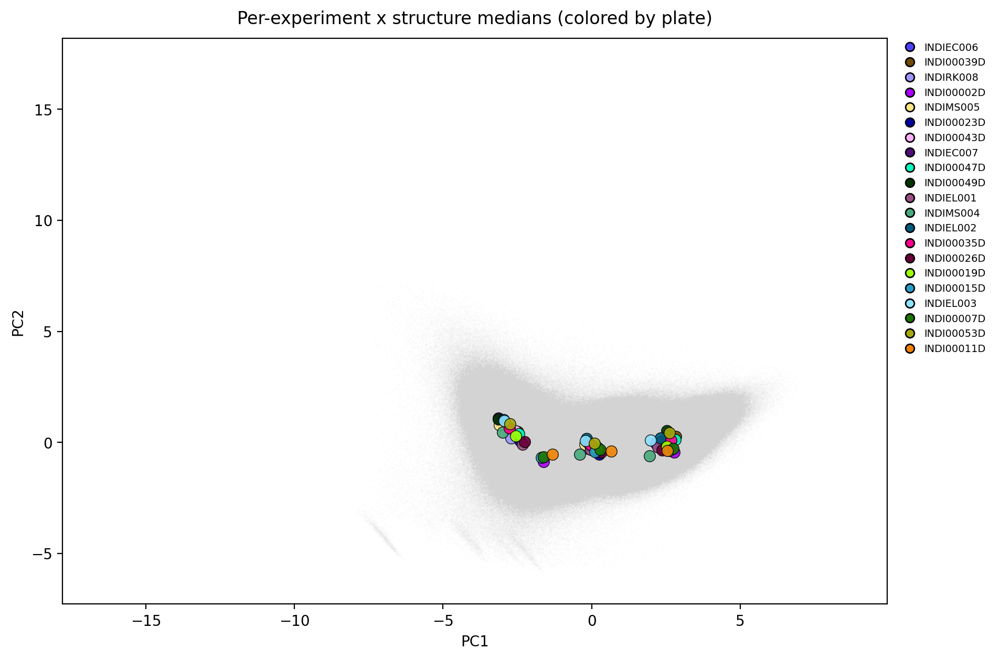

Std of per-experiment centroids, within structure (batch magnitude):
                PC1    PC2
Structure                 
Endosome      0.548  0.614
Lysosome      0.243  0.203
Mitochondria  0.256  0.300


In [14]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

def centroid_overlay(
    df, color_col, group_keys,
    pcx="PC1", pcy="PC2", palette=None, stat="median",
    bg_frac=1.0, s_centroid=60, figsize=(10, 7),
    legend_ncol=1, title=None, show_legend=True,
    bg_s=1, bg_alpha=0.03,          # NEW: default to the old hardcoded values
):
    fig, ax = plt.subplots(figsize=figsize, dpi=200)
    fig.subplots_adjust(right=0.78)

    bg = df.sample(frac=bg_frac, random_state=0) if bg_frac < 1.0 else df
    ax.scatter(bg[pcx], bg[pcy], s=bg_s, alpha=bg_alpha, color="lightgray",
               linewidths=0, rasterized=True)          # now uses the params

    agg_spec = {pcx: stat, pcy: stat}
    if color_col not in group_keys:
        agg_spec[color_col] = "first"
    cent = df.groupby(group_keys).agg(agg_spec).reset_index()

    vals = cent[color_col].astype("object")
    cats = vals.value_counts().index.tolist()

    if palette is not None:
        colors = [palette.get(c, "#808080") for c in cats]
    elif color_col == "Structure":
        colors = [STRUCTURE_COLORS.get(c, "#808080") for c in cats]
    elif color_col == "Genotype_Name":
        colors = [geno_colors[i % len(geno_colors)] for i in range(len(cats))]
    else:
        import seaborn as sns
        colors = sns.color_palette("husl", n_colors=len(cats))

    for c, col in zip(cats, colors):
        m = vals == c
        ax.scatter(cent.loc[m, pcx], cent.loc[m, pcy],
                   s=s_centroid, color=col, edgecolor="k", linewidths=0.5, alpha=0.9)

    ax.set_xlabel(pcx); ax.set_ylabel(pcy)
    ax.set_title(title or f"Per-group {stat} centroids ({color_col})", pad=10)

    if show_legend:
        handles = [
            Line2D([0], [0], marker="o", linestyle="", markersize=6,
                   markerfacecolor=col, markeredgecolor="k", label=str(c))
            for c, col in zip(cats, colors)
        ]
        ax.legend(handles=handles, loc="upper left", bbox_to_anchor=(1.01, 1.0),
                  frameon=False, fontsize=7, ncol=legend_ncol,
                  borderaxespad=0.0, handletextpad=0.4, columnspacing=0.8)
    plt.show()
    return cent


# --- 1) per-experiment centroids, colored by plate (batch spread) ---
# each dot = one experiment's median position; spread across plates = batch variation
centroid_overlay(
    df, color_col="iNDI_Plate_ID",
    group_keys=["Measurement_ID"],
    palette=plate_palette,
    title="Per-experiment medians (colored by plate)",
    figsize=(12, 7),
)

# --- 2) per-experiment x structure centroids, colored by structure ---
centroid_overlay(
    df, color_col="Structure",
    group_keys=["Measurement_ID", "Structure"],
    palette=STRUCTURE_COLORS,
    title="Per-experiment medians, by structure",
    figsize=(9, 7),
)

# --- 3) per-experiment x structure centroids, colored by plate ---
# tightest read on batch: within each structure blob, how far apart are plates?
centroid_overlay(
    df, color_col="iNDI_Plate_ID",
    group_keys=["Measurement_ID", "Structure"],
    palette=plate_palette,
    title="Per-experiment x structure medians (colored by plate)",
    figsize=(12, 7),
)

# batch spread = how much experiment centroids vary within each structure
cent = df.groupby(["Measurement_ID", "Structure"])[["PC1", "PC2"]].median().reset_index()
spread = cent.groupby("Structure")[["PC1", "PC2"]].std()
print("Std of per-experiment centroids, within structure (batch magnitude):")
print(spread.round(3))

In [15]:
cent = df.groupby(["iNDI_Plate_ID", "Structure"])[["PC1", "PC2"]].median().reset_index()

# distance of each plate's centroid from the per-structure grand centroid
grand = cent.groupby("Structure")[["PC1","PC2"]].transform("median")
cent["dist"] = np.sqrt((cent["PC1"]-grand["PC1"])**2 + (cent["PC2"]-grand["PC2"])**2)

print("Most off-center Parental plate centroids (per structure):")
print(cent.sort_values("dist", ascending=False).head(10).round(2).to_string(index=False))

Most off-center Parental plate centroids (per structure):
iNDI_Plate_ID    Structure   PC1   PC2  dist
   INDI00002D     Endosome -1.61 -0.86  1.64
   INDI00011D     Endosome -1.32 -0.53  1.60
   INDI00007D     Endosome -1.62 -0.66  1.48
   INDI00015D     Endosome -1.68 -0.69  1.46
    INDIEC007     Endosome -3.14  1.10  0.85
    INDIMS004 Mitochondria  1.94 -0.60  0.81
   INDI00049D     Endosome -3.14  1.04  0.80
    INDIEL002     Endosome -2.96  1.02  0.68
    INDIEC006     Endosome -3.05  0.92  0.66
    INDIEL003     Endosome -2.94  0.98  0.63


Points in streak region:
  n = 5844
  organelle_count value counts:
organelle_count
1     3325
2     1419
3      495
4      279
5      129
6       92
7       48
8       20
9       19
10       6
  Structure breakdown:
Structure
Endosome        5550
Lysosome         284
Mitochondria      10


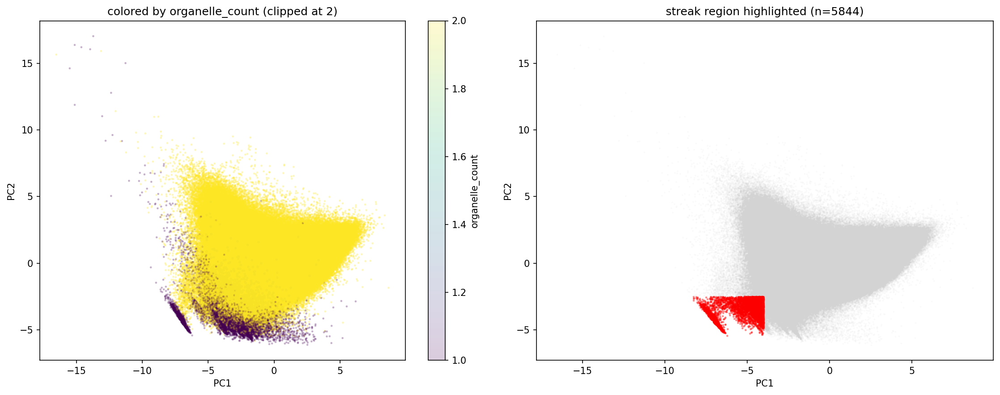

In [16]:
# What are the streaks?
# Mostly single endosomes in ROIs

import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(15, 6), dpi=150)

# left: color by organelle_count (clipped so low counts are visible)
sc = ax[0].scatter(df_shuf["PC1"], df_shuf["PC2"],
                   c=df_shuf["organelle_count"].clip(upper=2),
                   s=2, alpha=0.2, cmap="viridis", rasterized=True)
ax[0].set_xlabel("PC1"); ax[0].set_ylabel("PC2")
ax[0].set_title("colored by organelle_count (clipped at 2)")
plt.colorbar(sc, ax=ax[0], label="organelle_count")

# right: isolate just the streak region and low counts
streak = df_shuf[(df_shuf["PC2"] < -2.5) & (df_shuf["PC1"] < -4)]
print("Points in streak region:")
print("  n =", len(streak))
print("  organelle_count value counts:")
print(streak["organelle_count"].value_counts().head(10).to_string())
print("  Structure breakdown:")
print(streak["Structure"].value_counts().to_string())

ax[1].scatter(df_shuf["PC1"], df_shuf["PC2"], s=1, alpha=0.05,
             color="lightgray", rasterized=True)
ax[1].scatter(streak["PC1"], streak["PC2"], s=2, alpha=0.3,
             color="red", rasterized=True)
ax[1].set_xlabel("PC1"); ax[1].set_ylabel("PC2")
ax[1].set_title(f"streak region highlighted (n={len(streak)})")
plt.tight_layout(); plt.show()

In [20]:
# What does the ORIGINAL organelle feature parquet say for this exact ROI?
import pandas as pd
import pandas as pd
from pathlib import Path

org_dir = Path("/data/kelpschdj/iNDI/Production/outputs/"
               "run_20260803_124616_6otz/organelle_features")

# there may be several (one per experiment, and per version stamp)
files = sorted(org_dir.glob("*_organelle_features__*.parquet"))
print(f"{len(files)} file(s):")
for f in files:
    print(" ", f.name)

org = pd.concat((pd.read_parquet(f) for f in files), ignore_index=True)
print("total rows:", len(org))

roi = org[(org["DAPI_filename"] == "r02c03f04p01-ch01t01.tiff")
          & (org["Nucleus_ID"] == 9)]

cols = ["Structure", "organelle_count", "area_px",
        "average_organelle_area", "roi_occupancy"]
# include whatever provenance columns exist so duplicates are visible
for c in ("Measurement_ID", "Row", "Column", "Frame"):
    if c in roi.columns:
        cols.insert(0, c)

print(f"{len(roi)} row(s) matched")
print(roi[cols].to_string())

21 file(s):
  028ebee9-afaf-4ff8-b435-af11714285dc_organelle_features__20260803_171522.parquet
  07fc5da6-9d7d-4c97-858b-4b76df1859a5_organelle_features__20260803_171522.parquet
  2350e82d-40dd-4bb4-93de-44edec0d1718_organelle_features__20260803_171522.parquet
  2b1c31ad-579d-4ea6-a782-251ea083ed6a_organelle_features__20260803_171522.parquet
  2da14033-ab86-4f33-b4f7-ef375c80ce62_organelle_features__20260803_171522.parquet
  32d75d22-bd17-4629-8257-a4056e3ffcee_organelle_features__20260803_171522.parquet
  4405a3b2-6b88-49b1-91f3-992e09ccbd16_organelle_features__20260803_171522.parquet
  51cf625a-9422-406f-aa9e-a9f1238d1b96_organelle_features__20260803_171522.parquet
  72c0a713-b5d5-4cd4-a826-c556368ed1d1_organelle_features__20260803_171522.parquet
  7e03b502-ad64-4090-a9e2-fc4c3ecdae11_organelle_features__20260803_171522.parquet
  934f6de5-f58b-4a1e-b225-ac6414500bb7_organelle_features__20260803_171522.parquet
  9697941f-11d4-43bb-8f50-d424c4e05c29_organelle_features__20260803_171522.

total rows: 2963636
21 row(s) matched
         Frame  Column  Row                        Measurement_ID     Structure  organelle_count  area_px  average_organelle_area  roi_occupancy
285          4       3    2  028ebee9-afaf-4ff8-b435-af11714285dc      Endosome               43     1160               26.976744       0.025642
292          4       3    2  028ebee9-afaf-4ff8-b435-af11714285dc      Lysosome               46     2561               55.673913       0.056611
299          4       3    2  028ebee9-afaf-4ff8-b435-af11714285dc  Mitochondria               99     3498               35.333333       0.077323
121375       4       3    2  07fc5da6-9d7d-4c97-858b-4b76df1859a5      Endosome                1       12               12.000000       0.000265
121380       4       3    2  07fc5da6-9d7d-4c97-858b-4b76df1859a5      Lysosome               13      396               30.461538       0.008754
121385       4       3    2  07fc5da6-9d7d-4c97-858b-4b76df1859a5  Mitochondria             

In [24]:
import pandas as pd
from pathlib import Path

# 1. subset (same as before)
count1 = df_shuf[df_shuf["organelle_count"] == 1].copy()

qc_rois = (
    count1[["Measurement_ID", "Structure", "DAPI_filename",
            "Nucleus_ID", "channel_filename"]]
    .drop_duplicates(["Measurement_ID", "DAPI_filename", "Nucleus_ID", "Structure"])
    .sort_values(["Measurement_ID", "Structure", "DAPI_filename", "Nucleus_ID"])
    .reset_index(drop=True)
)

# 2. build Measurement_ID -> Experiment_name (folder) map from stage-0 metadata
meta_dir = Path("/data/kelpschdj/iNDI/Production/outputs/"
                "run_20260803_124616_6otz/image_metadata")
mp = pd.concat(
    (pd.read_parquet(f, columns=["Experiment_name", "Measurement_ID"])
     for f in meta_dir.glob("*_metadata.parquet")),
    ignore_index=True,
).drop_duplicates()

# 3. join the folder name on
qc_rois = qc_rois.merge(mp, on="Measurement_ID", how="left")

# 4. verify before writing
missing = qc_rois["Experiment_name"].isna().sum()
print(f"rows: {len(qc_rois)}, missing Experiment_name: {missing}")
assert "Experiment_name" in qc_rois.columns, "join didn't add the column!"

# 5. write
out = "/data/kelpschdj/iNDI/Production/notebooks/count1_target_rois.csv"
qc_rois.to_csv(out, index=False)

# 6. confirm the header on disk actually has it
print(pd.read_csv(out, nrows=0).columns.tolist())

rows: 11733, missing Experiment_name: 0
['Measurement_ID', 'Structure', 'DAPI_filename', 'Nucleus_ID', 'channel_filename', 'Experiment_name']


Image-level: 599159 rows (13440 images x 3 structures)
Well-level: 19056 rows
  Structure                        Measurement_ID subdirectory     area_px  \
0  Endosome  028ebee9-afaf-4ff8-b435-af11714285dc       r02c03  547.828571   
1  Endosome  028ebee9-afaf-4ff8-b435-af11714285dc       r02c04  576.439394   
2  Endosome  028ebee9-afaf-4ff8-b435-af11714285dc       r02c05  574.757143   
3  Endosome  028ebee9-afaf-4ff8-b435-af11714285dc       r02c06  646.971429   
4  Endosome  028ebee9-afaf-4ff8-b435-af11714285dc       r02c07  648.590909   

   organelle_count  roi_occupancy  mean_f_intensity  CoefOfVar_intensity  \
0        28.257143       0.012110       7200.389388             0.407569   
1        26.257576       0.012742       9082.195201             0.399618   
2        31.342857       0.012705       6465.318314             0.416983   
3        28.471429       0.014301       8150.295209             0.420743   
4        25.984848       0.014337       7534.606623             0.468567 

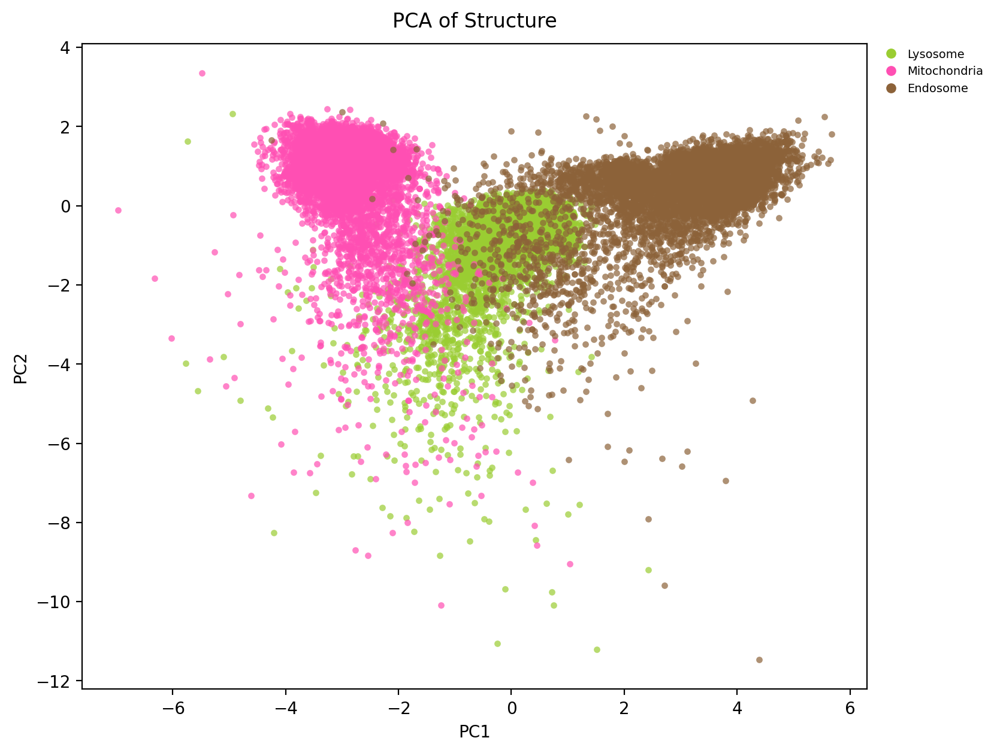

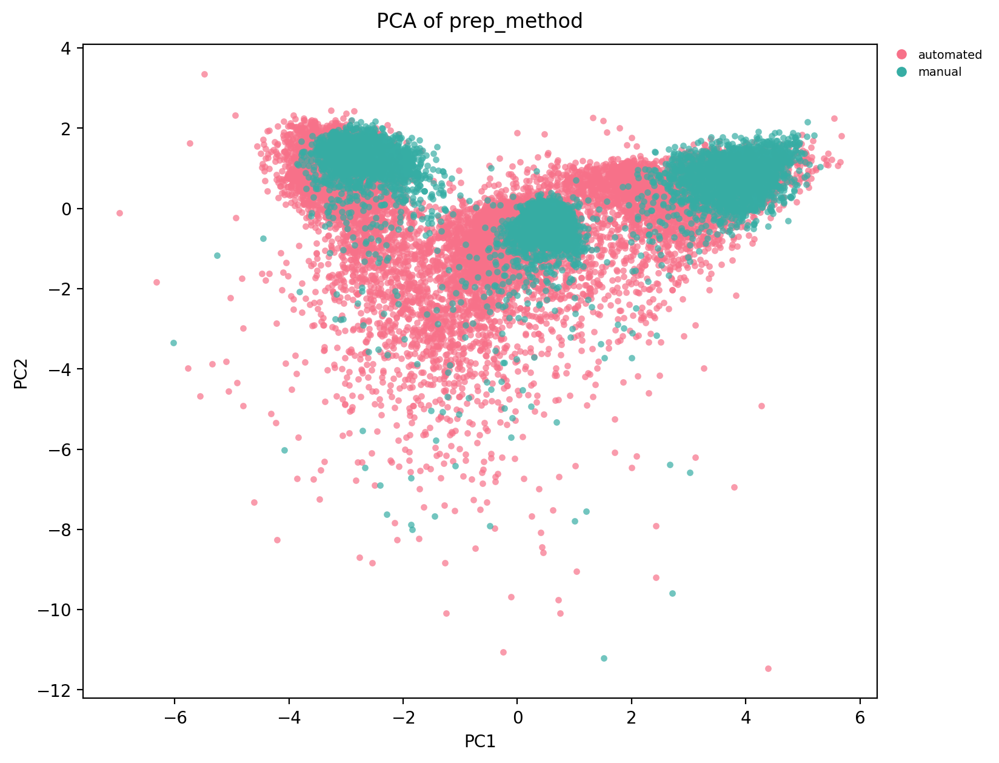

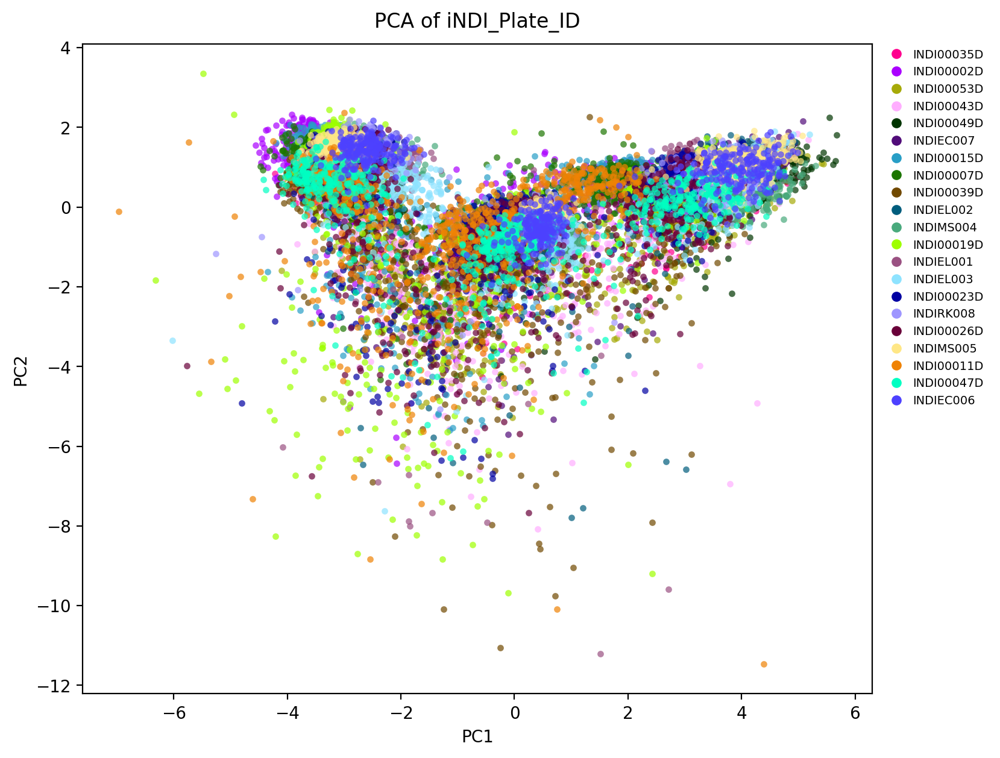

[warning] 70 genotypes > 64 colors; some will repeat.


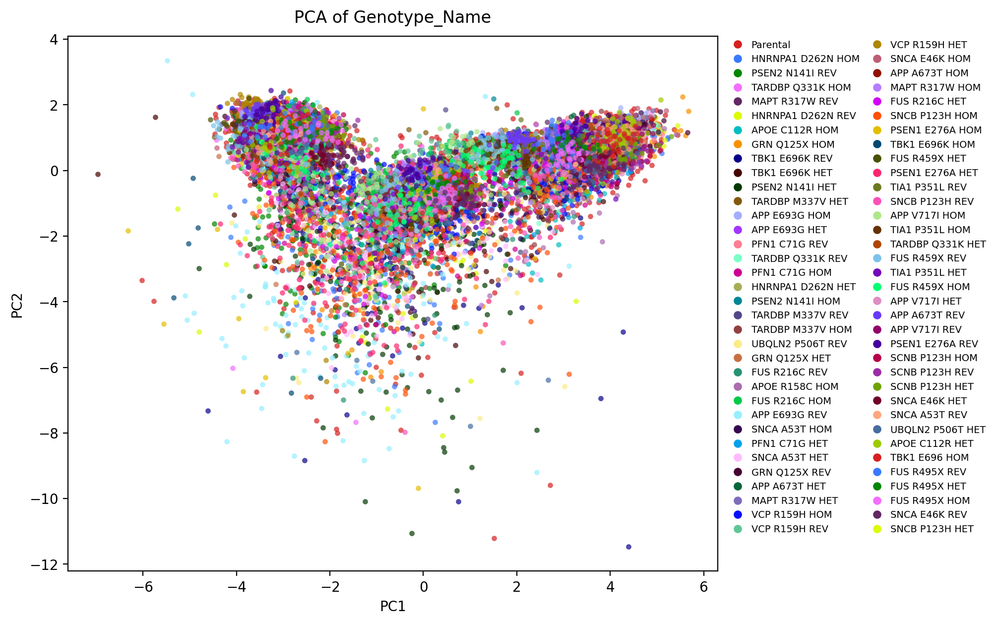

In [18]:
import pandas as pd

WELL_KEYS  = ["Measurement_ID", "subdirectory"]
IMAGE_KEY  = "DAPI_filename"
STRUCT_KEY = "Structure"

# metadata columns to carry through (identical within a group) — take .first()
# everything that isn't a feature, a PC, or a grouping key
GROUP_KEYS = [STRUCT_KEY, *WELL_KEYS, IMAGE_KEY]
DROP_COLS  = set(FEATURES) | {"PC1", "PC2", "PC3"} | set(GROUP_KEYS) \
             | {"Nucleus_ID", "channel_filename"}   # per-ROI, not meaningful post-agg
META_COLS  = [c for c in df.columns if c not in DROP_COLS]

# --- stage 1: median across ROIs within each image (per structure) ---
agg_image = {**{f: "median" for f in FEATURES},
             **{m: "first" for m in META_COLS}}
image_level = (
    df.groupby(GROUP_KEYS, as_index=False)
      .agg(agg_image)
)
print(f"Image-level: {len(image_level)} rows "
      f"({df[IMAGE_KEY].nunique()} images x {df[STRUCT_KEY].nunique()} structures)")

# --- stage 2: mean across images within each well (per structure) ---
WELL_GROUP = [STRUCT_KEY, *WELL_KEYS]
agg_well = {**{f: "mean" for f in FEATURES},
            **{m: "first" for m in META_COLS}}
well_level = (
    image_level.groupby(WELL_GROUP, as_index=False)
      .agg(agg_well)
)
print(f"Well-level: {len(well_level)} rows")
print(well_level.head())

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# fit PCA on the WELL-LEVEL aggregated features (each row = one well x structure)
Xw_df = well_level[FEATURES].replace([np.inf, -np.inf], np.nan)
keep = Xw_df.notna().all(axis=1)
well_level = well_level[keep].reset_index(drop=True)
Xw_df = Xw_df[keep].reset_index(drop=True)
print(f"Well-level PCA on {len(well_level)} rows "
      f"(dropped {(~keep).sum()} with NaN)")

Xw = StandardScaler().fit_transform(Xw_df.values)
pca_well = PCA(n_components=len(FEATURES))
scores_w = pca_well.fit_transform(Xw)
well_level["PC1"], well_level["PC2"], well_level["PC3"] = \
    scores_w[:, 0], scores_w[:, 1], scores_w[:, 2]

# scree + explained variance
evw = pca_well.explained_variance_ratio_
print("Well-level PC1-3:", evw[:3].round(3), "cumulative:", np.cumsum(evw)[:3].round(3))

# reuse your scatter + palette
pca_well_shuf = well_level.sample(frac=1, random_state=0).reset_index(drop=True)
pca_scatter(pca_well_shuf, "Structure", palette=STRUCTURE_COLORS, s=15, alpha=0.7)
pca_scatter(pca_well_shuf, "prep_method", s=15, alpha=0.7, title="PCA of prep_method")
pca_scatter(pca_well_shuf, "iNDI_Plate_ID", palette=plate_palette, s=15, alpha=0.7, title="PCA of iNDI_Plate_ID")
pca_scatter(pca_well_shuf, "Genotype_Name", s=15, alpha=0.7, title="PCA of Genotype_Name", legend_ncol=2)

Parental rows: 732266  (21 experiments, 21 plates, 3 structures)

Parental nuclei per plate (per structure ~ this/3):
iNDI_Plate_ID
INDI00002D    60228
INDI00019D    59900
INDI00043D    56054
INDI00035D    54355
INDI00049D    45711
INDI00053D    44211
INDI00039D    42302
INDI00023D    42075
INDI00007D    39338
INDI00011D    39303
INDI00047D    38561
INDIMS005     31257
INDI00015D    28886
INDIEL001     25085
INDIEL002     24034
INDIEC007     23471
INDIMS004     22563
INDIEC006     21751
INDI00026D    20897
INDIRK008      7418
INDIEL003      4866


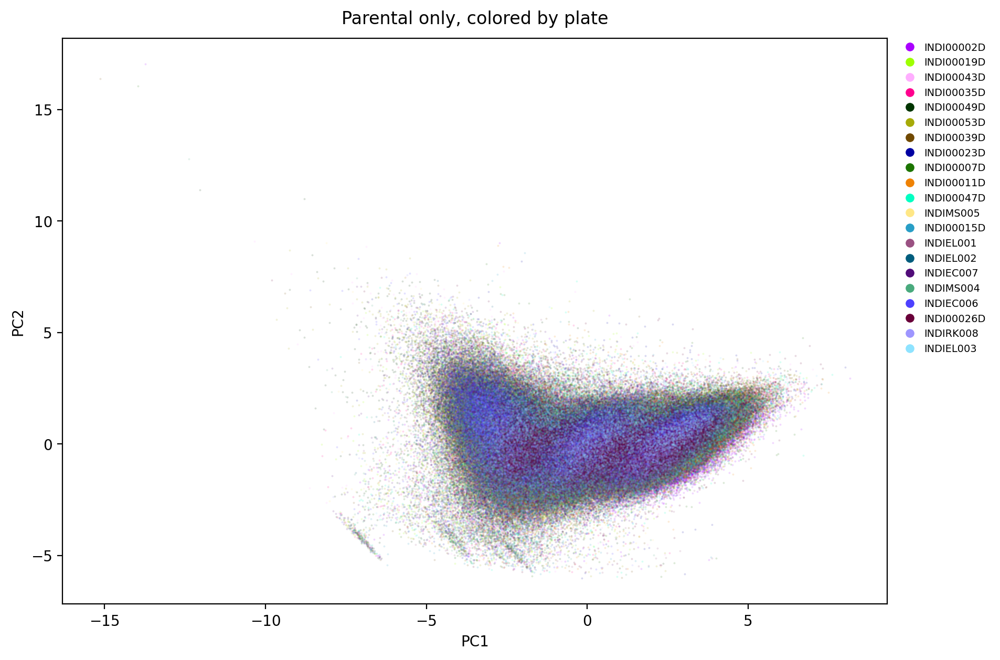

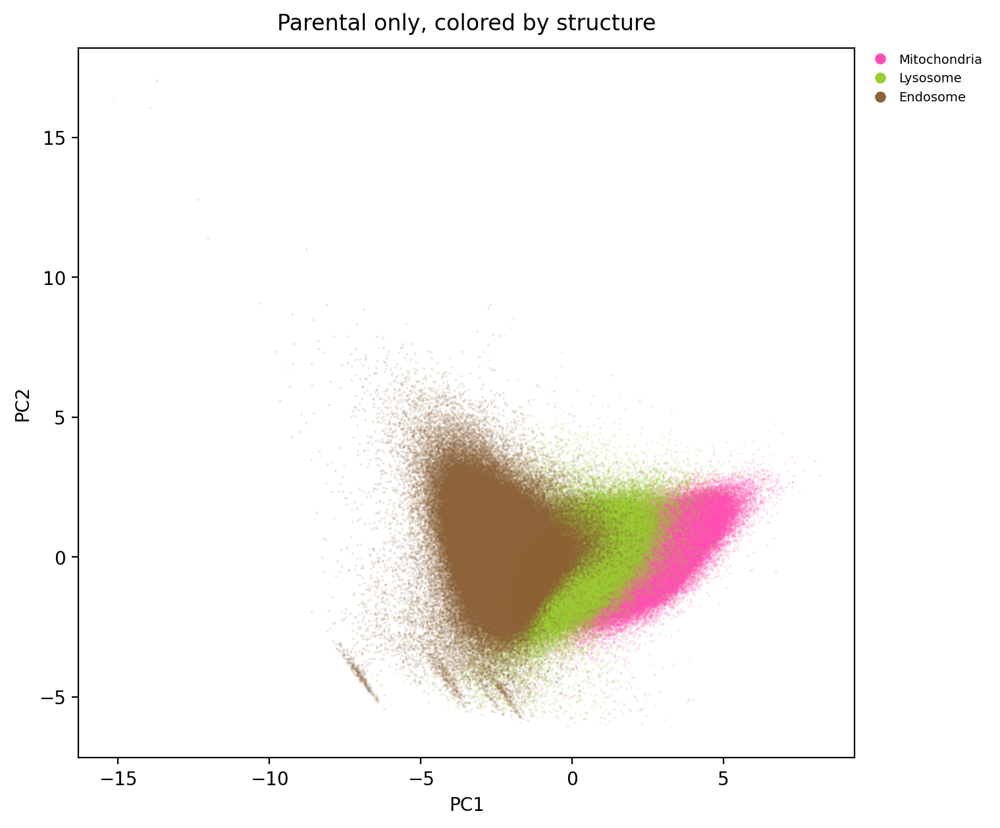

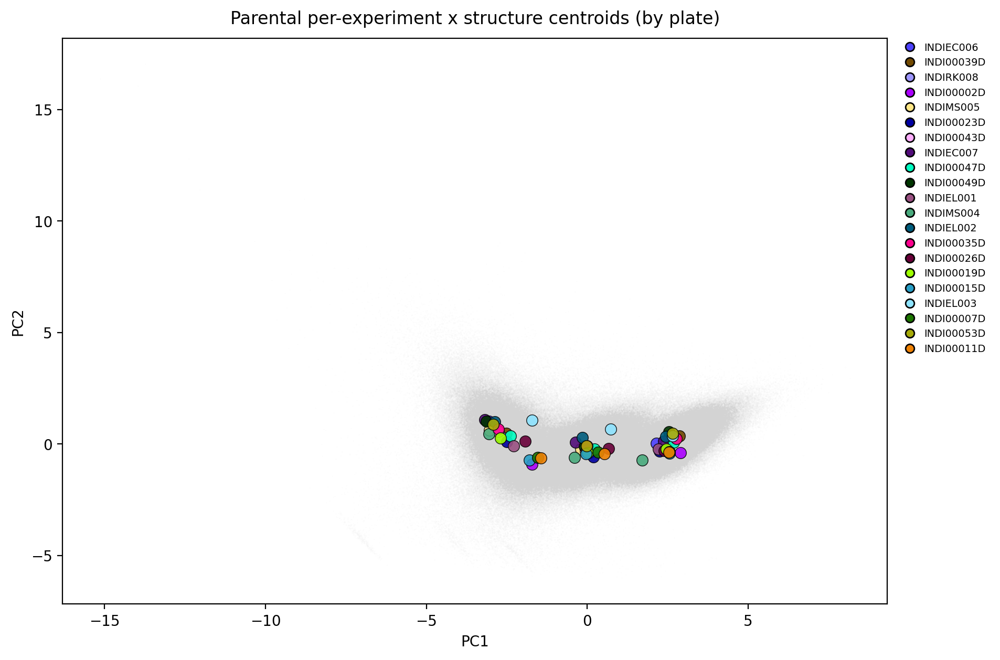

Parental batch spread (std of experiment centroids, within structure):
                PC1    PC2    PC3
Structure                        
Endosome      0.567  0.623  0.470
Lysosome      0.301  0.289  0.205
Mitochondria  0.271  0.348  0.179


In [19]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# --- subset to Parental (adjust the label if it's stored differently) ---
PARENTAL_LABEL = "Parental"
par = df[df["Genotype_Name"] == PARENTAL_LABEL].copy()
print(f"Parental rows: {len(par)}  ({par['Measurement_ID'].nunique()} experiments, "
      f"{par['iNDI_Plate_ID'].nunique()} plates, {par['Structure'].nunique()} structures)")

# how many Parental nuclei per plate? (can you normalize to it on every plate?)
print("\nParental nuclei per plate (per structure ~ this/3):")
print(par.groupby("iNDI_Plate_ID").size().sort_values(ascending=False).to_string())

par_shuf = par.sample(frac=1, random_state=0).reset_index(drop=True)

# Parental colored by plate — spread here = batch effect on wild-type
pca_scatter(par_shuf, "iNDI_Plate_ID", palette=plate_palette,
            figsize=(12, 7), title="Parental only, colored by plate")

# Parental colored by structure — should still show the 3 structure blobs
pca_scatter(par_shuf, "Structure", palette=STRUCTURE_COLORS,
            figsize=(9, 7), title="Parental only, colored by structure")

# per-plate centroids over the Parental cloud (quantify batch spread)
cent = centroid_overlay(
    par, color_col="iNDI_Plate_ID",
    group_keys=["Measurement_ID", "Structure"],
    palette=plate_palette, bg_frac=1.0,
    title="Parental per-experiment x structure centroids (by plate)",
    figsize=(12, 7),
)

# batch magnitude on Parental: std of per-experiment centroids within structure
par_cent = par.groupby(["Measurement_ID", "Structure"])[["PC1", "PC2", "PC3"]].median().reset_index()
print("Parental batch spread (std of experiment centroids, within structure):")
print(par_cent.groupby("Structure")[["PC1", "PC2", "PC3"]].std().round(3))

In [20]:
par = df[df["Genotype_Name"] == "Parental"]
cent = par.groupby(["iNDI_Plate_ID", "Structure"])[["PC1","PC2"]].median().reset_index()

# distance of each plate's centroid from the per-structure grand centroid
grand = cent.groupby("Structure")[["PC1","PC2"]].transform("median")
cent["dist"] = np.sqrt((cent["PC1"]-grand["PC1"])**2 + (cent["PC2"]-grand["PC2"])**2)

print("Most off-center Parental plate centroids (per structure):")
print(cent.sort_values("dist", ascending=False).head(10).round(2).to_string(index=False))

Most off-center Parental plate centroids (per structure):
iNDI_Plate_ID    Structure   PC1   PC2  dist
   INDI00002D     Endosome -1.71 -0.91  1.67
   INDI00011D     Endosome -1.44 -0.61  1.63
   INDI00007D     Endosome -1.53 -0.59  1.55
   INDI00015D     Endosome -1.79 -0.71  1.45
    INDIEL003     Lysosome  0.73  0.68  1.18
    INDIEL003     Endosome -1.72  1.07  1.13
    INDIMS004 Mitochondria  1.70 -0.73  1.10
    INDIEC007     Endosome -3.19  1.09  0.82
   INDI00026D     Endosome -1.93  0.14  0.80
   INDI00049D     Endosome -3.13  1.03  0.73


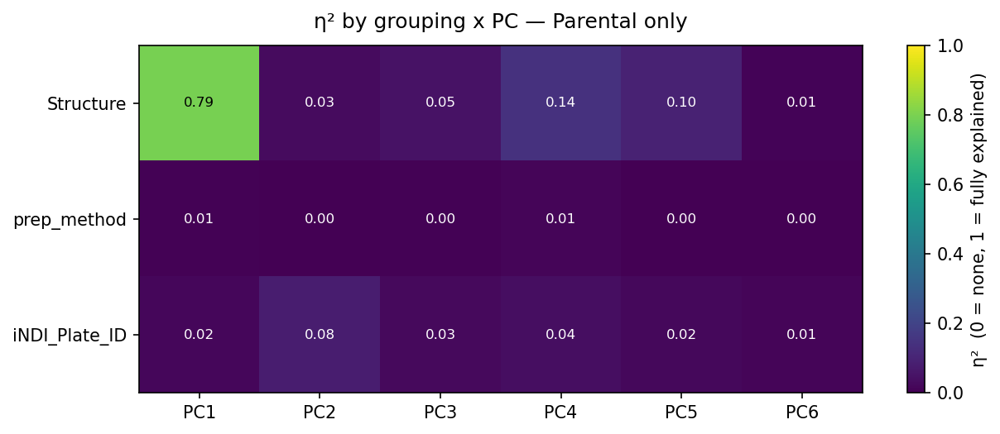

In [21]:
par = df[df["Genotype_Name"] == "Parental"]
eta_par = eta_heatmap(
    par, ["Structure", "prep_method", "iNDI_Plate_ID"],
    n_pcs=6, title="η² by grouping x PC — Parental only",
)

## Drop manual data

Automated-only: 1763769 rows (1199867 manual rows dropped, 40.5%)
  13 plates, 58 genotypes, 3 structures


PCA on 1763769 rows (dropped 0 NaN)
Automated-only EVR: [0.468 0.138 0.119 0.088 0.073] | cumulative: [0.468 0.606 0.725 0.813 0.886]


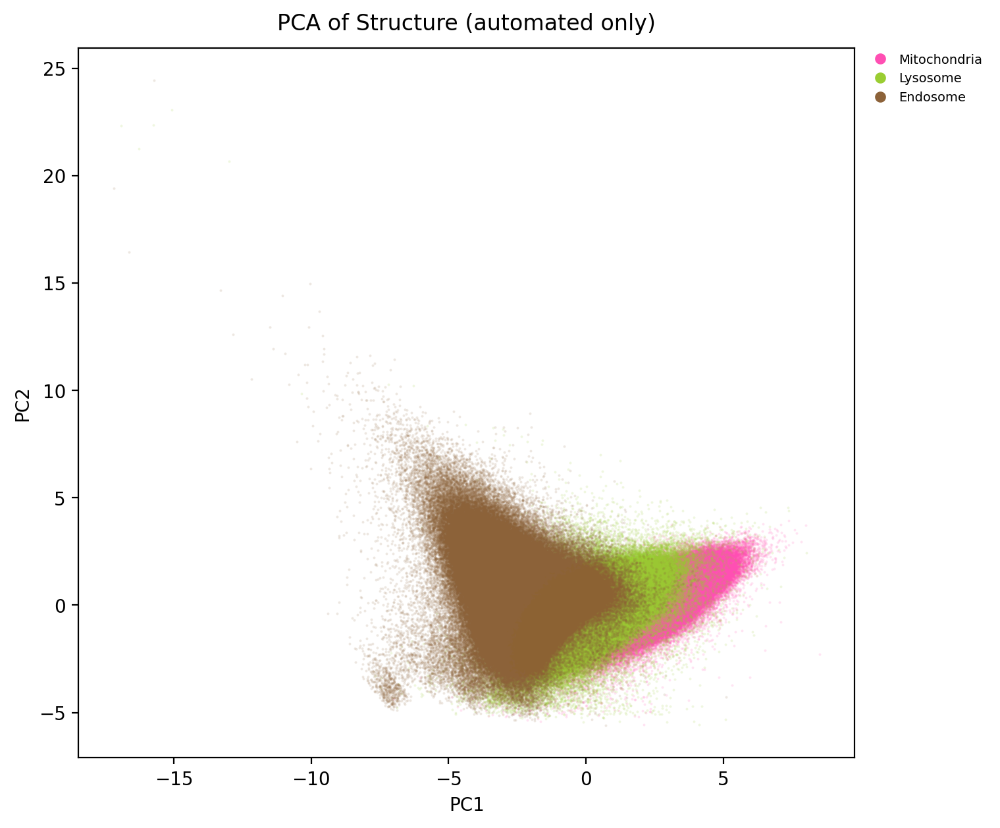

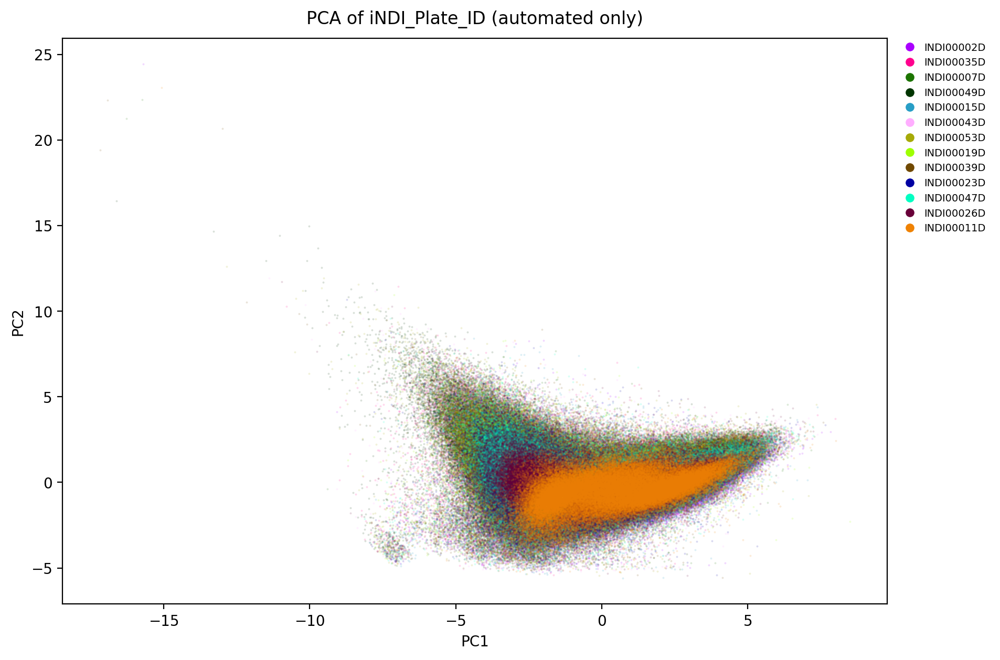

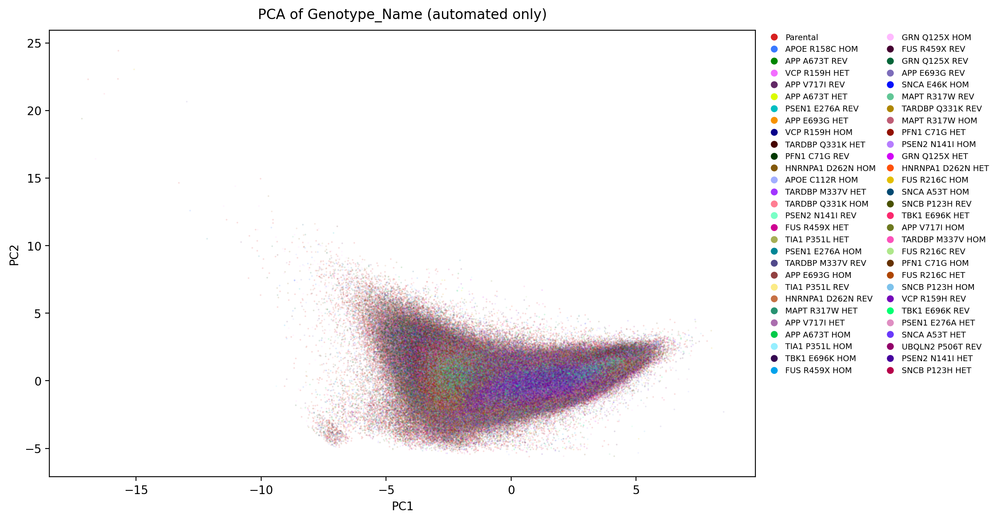

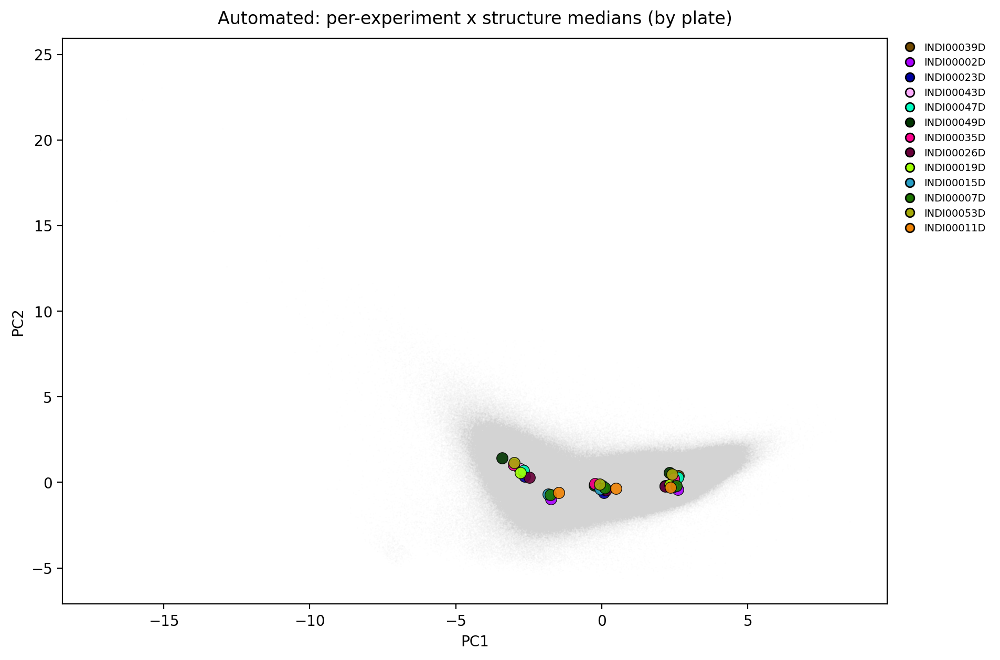

In [22]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# --- subset to automated prep only ---
auto = df[df["prep_method"] == "automated"].copy()
print(f"Automated-only: {len(auto)} rows "
      f"({len(df) - len(auto)} manual rows dropped, "
      f"{(len(df)-len(auto))/len(df)*100:.1f}%)")
print(f"  {auto['iNDI_Plate_ID'].nunique()} plates, "
      f"{auto['Genotype_Name'].nunique()} genotypes, "
      f"{auto['Structure'].nunique()} structures")

# --- refit PCA on automated data only (don't reuse the pooled fit) ---
X_df = auto[FEATURES].replace([np.inf, -np.inf], np.nan)
keep = X_df.notna().all(axis=1)
auto = auto[keep].reset_index(drop=True)
X_df = X_df[keep].reset_index(drop=True)
print(f"PCA on {len(auto)} rows (dropped {(~keep).sum()} NaN)")

scaler_auto = StandardScaler()
X = scaler_auto.fit_transform(X_df.values)
pca_auto = PCA(n_components=len(FEATURES))
scores = pca_auto.fit_transform(X)
for i in range(scores.shape[1]): 
    auto[f"PC{i+1}"] = scores[:, i]

ev = pca_auto.explained_variance_ratio_
print("Automated-only EVR:", ev[:5].round(3), "| cumulative:", np.cumsum(ev)[:5].round(3))

# --- standard panels ---
auto_shuf = auto.sample(frac=1, random_state=0).reset_index(drop=True)
pca_scatter(auto_shuf, "Structure", palette=STRUCTURE_COLORS,
            figsize=(9, 7), title="PCA of Structure (automated only)")
pca_scatter(auto_shuf, "iNDI_Plate_ID", palette=plate_palette,
            figsize=(12, 7), title="PCA of iNDI_Plate_ID (automated only)")
pca_scatter(auto_shuf, "Genotype_Name",
            figsize=(13, 7), legend_ncol=2, title="PCA of Genotype_Name (automated only)")

# --- per-experiment x structure median centroids, colored by plate ---
# batch spread within the automated cohort (13 D-plates)
cent_auto = centroid_overlay(
    auto, color_col="iNDI_Plate_ID",
    group_keys=["Measurement_ID", "Structure"],
    palette=plate_palette, stat="median", bg_frac=1.0,
    title="Automated: per-experiment x structure medians (by plate)",
    figsize=(12, 7),
)

In [23]:
# does automated-only reproduce the same PC meanings?
groups = auto["Structure"].to_numpy()
def eta_sq(v, g):
    v = np.asarray(v, float); gm = v.mean()
    ssb = sum(len(v[g==k]) * (v[g==k].mean()-gm)**2 for k in pd.unique(g))
    return ssb / ((v-gm)**2).sum()
print("Structure η² (automated fit):",
      {f"PC{i+1}": round(eta_sq(scores[:, i], groups), 3) for i in range(4)})

loadings_auto = pd.DataFrame(pca_auto.components_.T, index=FEATURES,
                             columns=[f"PC{i+1}" for i in range(len(FEATURES))])
print("\nAutomated loadings (PC1-4):")
print(loadings_auto.iloc[:, :4].round(3))

Structure η² (automated fit): {'PC1': np.float64(0.773), 'PC2': np.float64(0.044), 'PC3': np.float64(0.026), 'PC4': np.float64(0.109)}

Automated loadings (PC1-4):
                              PC1    PC2    PC3    PC4
area_px                     0.385  0.279 -0.007  0.115
organelle_count             0.322  0.231 -0.046 -0.033
roi_occupancy               0.385  0.279 -0.007  0.115
mean_f_intensity           -0.292  0.505  0.192 -0.324
CoefOfVar_intensity        -0.046  0.538 -0.120  0.607
eccentricity_median         0.354 -0.047  0.146 -0.318
solidity_median            -0.376  0.013 -0.126  0.159
extent_median              -0.381 -0.006 -0.143  0.232
intensity_max_median       -0.294  0.429  0.220 -0.434
dist_to_centroid_norm_mean  0.066  0.066  0.671  0.237
dist_to_centroid_std        0.099  0.237 -0.625 -0.273


Genotype_Name: 0 well(s) with >1 value
iNDI_Plate_ID: 0 well(s) with >1 value
prep_method: 0 well(s) with >1 value

Image-level: 375096 rows (13440 images x 3 structures)
Well-level: 12462 rows (4154 wells x structures)

Well-level PCA on 12462 rows (dropped 0 NaN)
Well-level EVR: [0.553 0.174 0.083 0.073 0.053] | cumulative: [0.553 0.727 0.81  0.883 0.936]


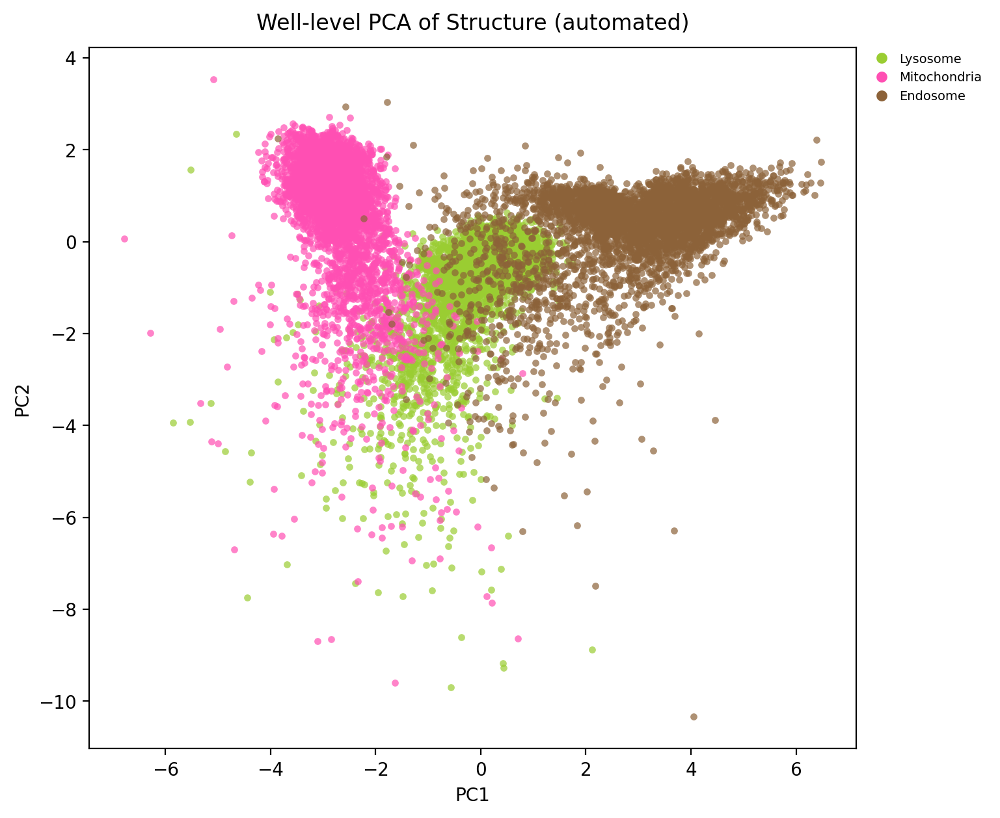

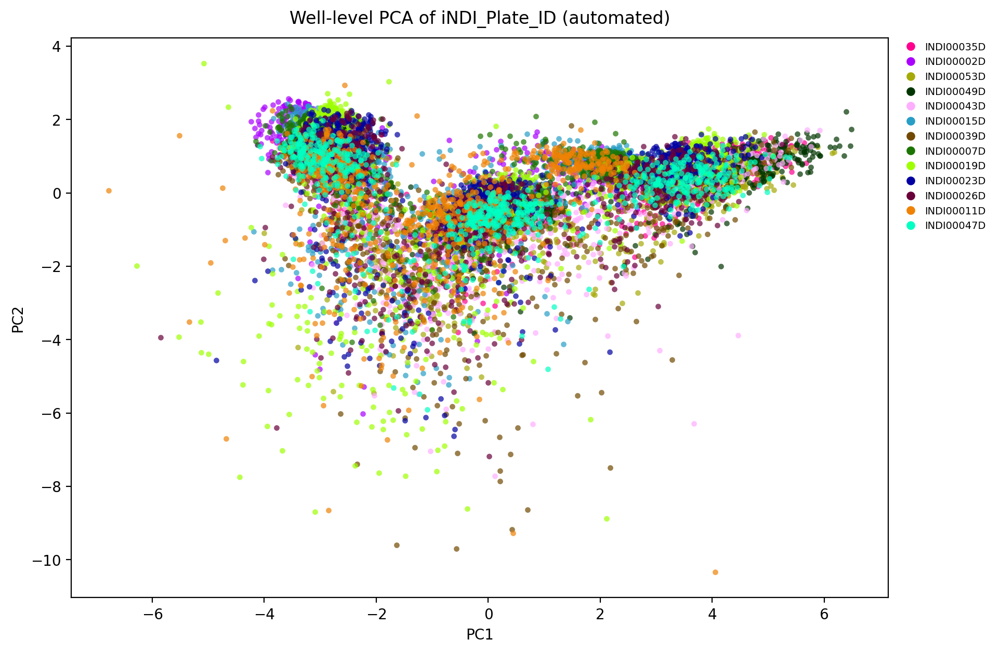

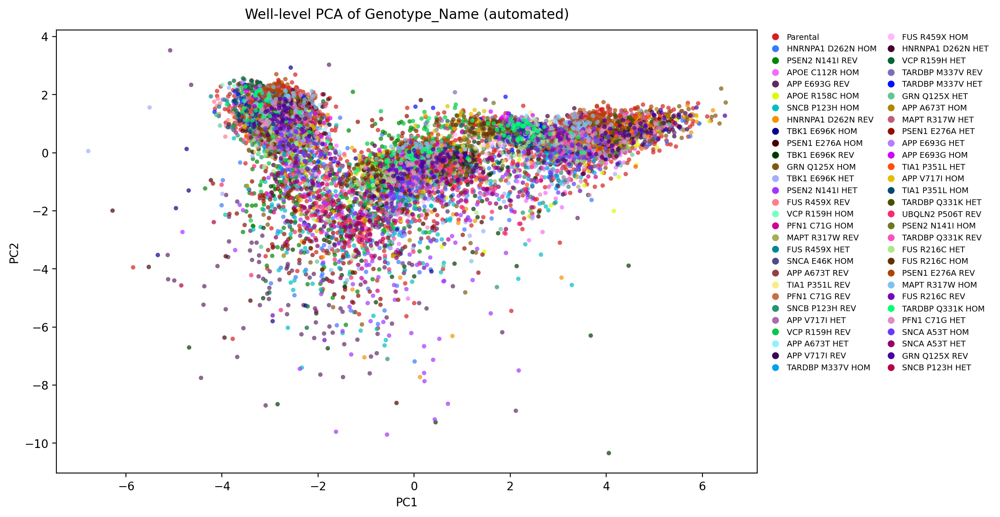

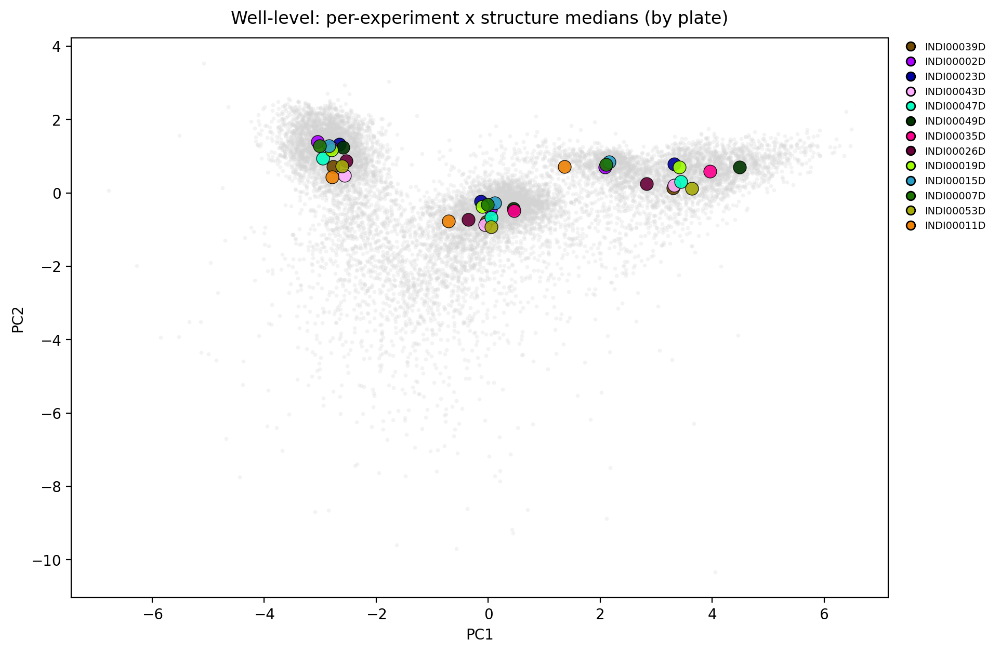

In [24]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# ================================================================
# WELL-LEVEL aggregation on AUTOMATED data (median->image, mean->well)
# ================================================================
WELL_KEYS  = ["Measurement_ID", "subdirectory"]
IMAGE_KEY  = "DAPI_filename"
STRUCT_KEY = "Structure"

GROUP_KEYS = [STRUCT_KEY, *WELL_KEYS, IMAGE_KEY]
DROP_COLS  = set(FEATURES) | {f"PC{i+1}" for i in range(10)} | set(GROUP_KEYS) \
             | {"Nucleus_ID", "channel_filename"}
META_COLS  = [c for c in auto.columns if c not in DROP_COLS]

# safety: confirm metadata carried by .first() is invariant within a well
for col in ["Genotype_Name", "iNDI_Plate_ID", "prep_method"]:
    n_bad = (auto.groupby(WELL_KEYS)[col].nunique() > 1).sum()
    flag = "  <-- CHECK" if n_bad else ""
    print(f"{col}: {n_bad} well(s) with >1 value{flag}")

# --- stage 1: median across ROIs within each image (per structure) ---
agg_image = {**{f: "median" for f in FEATURES},
             **{m: "first" for m in META_COLS}}
image_level = auto.groupby(GROUP_KEYS, as_index=False).agg(agg_image)
print(f"\nImage-level: {len(image_level)} rows "
      f"({auto[IMAGE_KEY].nunique()} images x {auto[STRUCT_KEY].nunique()} structures)")

# --- stage 2: mean across images within each well (per structure) ---
WELL_GROUP = [STRUCT_KEY, *WELL_KEYS]
agg_well = {**{f: "mean" for f in FEATURES},
            **{m: "first" for m in META_COLS}}
well_level = image_level.groupby(WELL_GROUP, as_index=False).agg(agg_well)
print(f"Well-level: {len(well_level)} rows "
      f"({well_level.groupby(WELL_KEYS).ngroups} wells x structures)")

# ================================================================
# refit PCA on WELL-LEVEL automated profiles
# ================================================================
Xw_df = well_level[FEATURES].replace([np.inf, -np.inf], np.nan)
keep = Xw_df.notna().all(axis=1)
well_level = well_level[keep].reset_index(drop=True)
Xw_df = Xw_df[keep].reset_index(drop=True)
print(f"\nWell-level PCA on {len(well_level)} rows (dropped {(~keep).sum()} NaN)")

scaler_well = StandardScaler()
Xw = scaler_well.fit_transform(Xw_df.values)
pca_well = PCA(n_components=len(FEATURES))
scores_w = pca_well.fit_transform(Xw)
for i in range(min(5, scores_w.shape[1])):
    well_level[f"PC{i+1}"] = scores_w[:, i]

evw = pca_well.explained_variance_ratio_
print("Well-level EVR:", evw[:5].round(3), "| cumulative:", np.cumsum(evw)[:5].round(3))

# ================================================================
# standard panels (larger markers — far fewer points now)
# ================================================================
well_shuf = well_level.sample(frac=1, random_state=0).reset_index(drop=True)
pca_scatter(well_shuf, "Structure", palette=STRUCTURE_COLORS,
            s=15, alpha=0.7, figsize=(9, 7),
            title="Well-level PCA of Structure (automated)")
pca_scatter(well_shuf, "iNDI_Plate_ID", palette=plate_palette,
            s=15, alpha=0.7, figsize=(12, 7),
            title="Well-level PCA of iNDI_Plate_ID (automated)")
pca_scatter(well_shuf, "Genotype_Name",
            s=15, alpha=0.7, figsize=(13, 7), legend_ncol=2,
            title="Well-level PCA of Genotype_Name (automated)")

# ================================================================
# well-level centroids by plate (batch spread at well resolution)
# ================================================================
cent_well = centroid_overlay(
    well_level, color_col="iNDI_Plate_ID",
    group_keys=["Measurement_ID", "Structure"],
    palette=plate_palette, stat="median",
    bg_s=8, bg_alpha=0.25,          # only this call gets the heavier background
    s_centroid=80, figsize=(12, 7),
    title="Well-level: per-experiment x structure medians (by plate)",
)

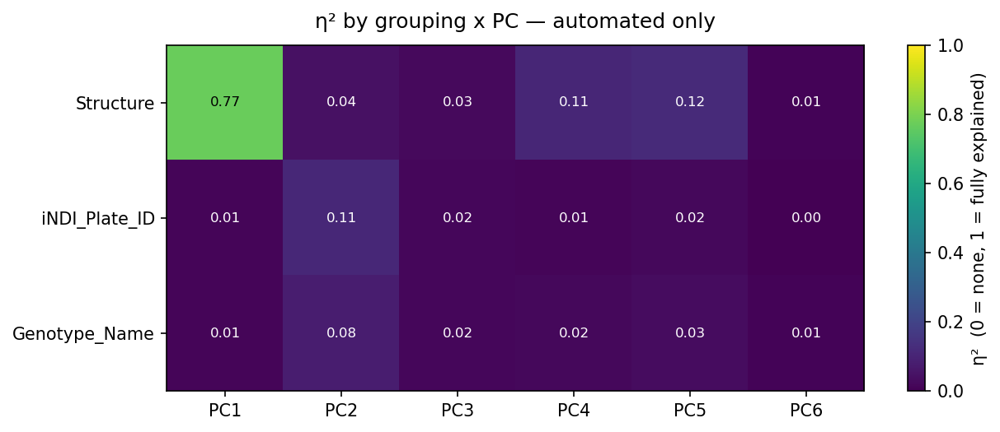

In [25]:
eta_auto = eta_heatmap(
    auto, ["Structure", "iNDI_Plate_ID", "Genotype_Name"],  # drop prep_method: all "automated"
    n_pcs=6, title="η² by grouping x PC — automated only",
)

Cells per line x structure:
Structure      Endosome  Lysosome  Mitochondria
Genotype_Name                                  
FUS R459X HET      9160      9164          9176
FUS R459X HOM      7736      7713          7740
FUS R459X REV      7613      7600          7622

Plates per line: {'FUS R459X HOM': ['INDI00002D'], 'FUS R459X HET': ['INDI00002D'], 'FUS R459X REV': ['INDI00002D']}

=== Lysosome: % change from same-plate Parental ===
               area_px  organelle_count  roi_occupancy  mean_f_intensity  CoefOfVar_intensity  eccentricity_median  solidity_median  extent_median  intensity_max_median  dist_to_centroid_norm_mean  dist_to_centroid_std
Genotype_Name                                                                                                                                                                                                             
FUS R459X HOM      9.4             -8.3            9.4              -5.4                 -2.7                  3.7         

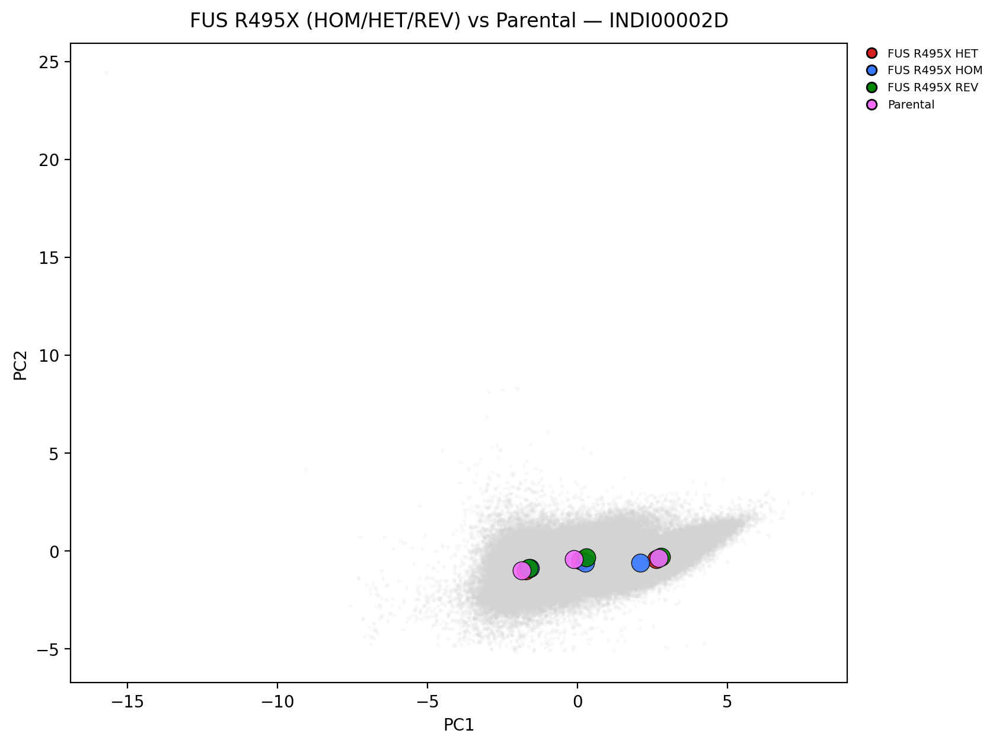

In [26]:
# --- positive control: FUS R459X series, all on INDI00002D (automated) ---
# Clean contrast = HOM vs its own REV (shares plate -> plate effect cancels).
# Parental comparison is confounded (different plates), so treat REV as the baseline.
FUS_LINES = ["FUS R459X HOM", "FUS R459X HET", "FUS R459X REV"]

sub = auto[auto["Genotype_Name"].isin(FUS_LINES)].copy()
print("Cells per line x structure:")
print(sub.groupby(["Genotype_Name", "Structure"]).size().unstack(fill_value=0).to_string())

# confirm they really are all one plate (so REV is the right baseline, not Parental)
print("\nPlates per line:", {g: list(sub[sub.Genotype_Name==g].iNDI_Plate_ID.unique())
                             for g in FUS_LINES})

# display-only label corrections (data left untouched)
LABEL_FIXES = {
    "FUS R459X HET": "FUS R495X HET",
    "FUS R459X HOM": "FUS R495X HOM",
    "FUS R459X REV": "FUS R495X REV",
}

def fix_labels(frame, col="Genotype_Name"):
    """Return a COPY with display labels corrected — does not modify the original."""
    out = frame.copy()
    out[col] = out[col].replace(LABEL_FIXES)
    return out

FUS_PLATE = "INDI00002D"
order = ["FUS R459X HOM", "FUS R459X HET", "FUS R459X REV", "Parental"]  # severity order

sub = auto[(auto["iNDI_Plate_ID"] == FUS_PLATE) &
           (auto["Genotype_Name"].isin(order))].copy()

for struct in ["Lysosome", "Mitochondria", "Endosome"]:
    s = sub[sub["Structure"] == struct]
    if s.empty:
        continue
    med = s.groupby("Genotype_Name")[FEATURES].median().reindex(order)
    # express HOM/HET/REV as % change from same-plate Parental
    par = med.loc["Parental"]
    pct = ((med - par) / par * 100).round(1).drop("Parental")
    print(f"\n=== {struct}: % change from same-plate Parental ===")
    print(pct.to_string())

cent_fus = centroid_overlay(
    fix_labels(sub), color_col="Genotype_Name",
    group_keys=["Genotype_Name", "Structure"],
    bg_s=6, bg_alpha=0.15, s_centroid=120, figsize=(10, 7),
    title=f"FUS R495X (HOM/HET/REV) vs Parental — {FUS_PLATE}",
)

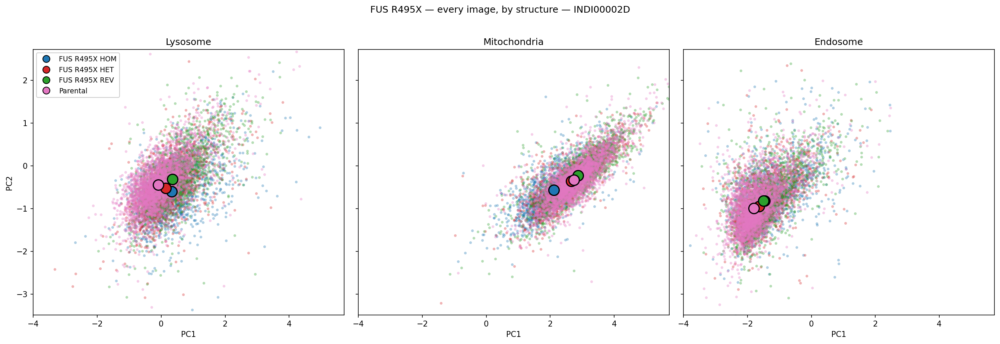

In [27]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

FUS_PLATE = "INDI00002D"
order = ["FUS R459X HOM", "FUS R459X HET", "FUS R459X REV", "Parental"]
disp  = {"FUS R459X HOM":"FUS R495X HOM","FUS R459X HET":"FUS R495X HET",
         "FUS R459X REV":"FUS R495X REV","Parental":"Parental"}
line_colors = {"FUS R495X HOM":"#1f77b4","FUS R495X HET":"#d62728",
               "FUS R495X REV":"#2ca02c","Parental":"#e377c2"}

src = image_level[(image_level["iNDI_Plate_ID"] == FUS_PLATE) &
                  (image_level["Genotype_Name"].isin(order))].copy()
Xi = scaler_auto.transform(src[FEATURES].replace([np.inf,-np.inf], np.nan).values)
si = pca_auto.transform(Xi)
src["PC1"], src["PC2"] = si[:,0], si[:,1]

structs = ["Lysosome", "Mitochondria", "Endosome"]

PAD = 1.5
x_lo = src["PC1"].quantile(.01) - PAD
x_hi = src["PC1"].quantile(.99) + PAD
y_lo = src["PC2"].quantile(.01) - PAD
y_hi = src["PC2"].quantile(.99) + PAD

fig, axes = plt.subplots(1, 3, figsize=(18, 6), dpi=150,
                         sharex=True, sharey=True)

for ax, struct in zip(axes, structs):
    s = src[src["Structure"] == struct]
    for g in order:
        gg = s[s["Genotype_Name"] == g]
        ax.scatter(gg["PC1"], gg["PC2"], s=12, alpha=0.35,
                   color=line_colors[disp[g]], linewidths=0, rasterized=True)
    for g in order:
        gg = s[s["Genotype_Name"] == g]
        if gg.empty: continue
        ax.scatter(gg["PC1"].median(), gg["PC2"].median(), s=180,
                   color=line_colors[disp[g]], edgecolor="k",
                   linewidths=1.5, zorder=5)
    ax.set_xlim(x_lo, x_hi)
    ax.set_ylim(y_lo, y_hi)
    ax.set_title(struct); ax.set_xlabel("PC1")

axes[0].set_ylabel("PC2")

# --- opaque legend handles (full color, not the faded scatter alpha) ---
handles = [
    Line2D([0], [0], marker="o", linestyle="", markersize=9,
           markerfacecolor=line_colors[disp[g]], markeredgecolor="k",
           markeredgewidth=1.0, alpha=1.0, label=disp[g])
    for g in order
]
axes[0].legend(handles=handles, loc="upper left", fontsize=9,
               frameon=True, framealpha=0.95)

fig.suptitle(f"FUS R495X — every image, by structure — {FUS_PLATE}", y=1.02)
plt.tight_layout(); plt.show()

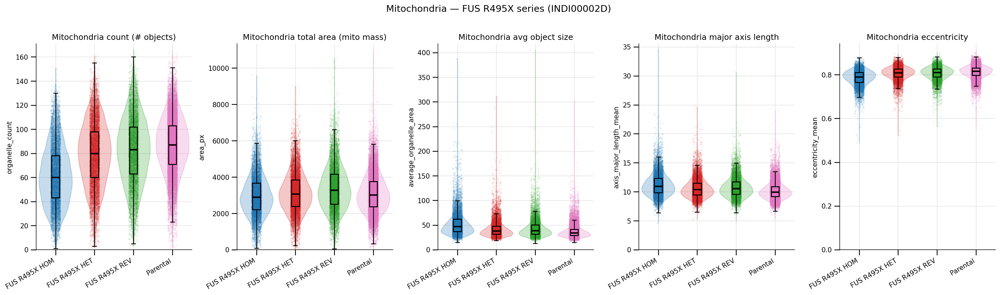

Medians:
               organelle_count  area_px  average_organelle_area  axis_major_length_mean  eccentricity_mean
Genotype_Name                                                                                             
FUS R459X HOM             60.0   2896.0                   46.85                   10.96               0.79
FUS R459X HET             80.0   3079.0                   38.16                   10.37               0.81
FUS R459X REV             83.0   3287.0                   38.94                   10.55               0.81
Parental                  87.0   3011.0                   34.06                    9.97               0.82

% change from Parental:
               organelle_count  area_px  average_organelle_area  axis_major_length_mean  eccentricity_mean
Genotype_Name                                                                                             
FUS R459X HOM            -31.0     -3.8                    37.6                     9.9               -3.1
FUS

In [28]:
import numpy as np
import matplotlib.pyplot as plt

FUS_PLATE = "INDI00002D"
STRUCT    = "Mitochondria"
order = ["FUS R459X HOM", "FUS R459X HET", "FUS R459X REV", "Parental"]
disp  = {"FUS R459X HOM":"FUS R495X HOM","FUS R459X HET":"FUS R495X HET",
         "FUS R459X REV":"FUS R495X REV","Parental":"Parental"}
line_colors = {"FUS R495X HOM":"#1f77b4","FUS R495X HET":"#d62728",
               "FUS R495X REV":"#2ca02c","Parental":"#e377c2"}

s = auto[(auto["iNDI_Plate_ID"] == FUS_PLATE) &
         (auto["Structure"] == STRUCT) &
         (auto["Genotype_Name"].isin(order))]

feats  = ["organelle_count", "area_px", "average_organelle_area",
          "axis_major_length_mean", "eccentricity_mean"]
titles = ["count (# objects)", "total area (mito mass)", "avg object size",
          "major axis length", "eccentricity"]
rng = np.random.default_rng(0)

fig, axes = plt.subplots(1, 5, figsize=(21, 6), dpi=150)
fig.patch.set_facecolor("white")

for ax, feat, ttl in zip(axes, feats, titles):
    if feat not in s.columns:
        ax.set_title(f"{feat} missing"); continue
    ax.set_facecolor("white")
    ax.grid(True, color="#dddddd", lw=0.7, zorder=0)
    ax.set_axisbelow(True)
    for spine in ("top", "right"):
        ax.spines[spine].set_visible(False)

    data, colors, positions = [], [], []
    for i, g in enumerate(order):
        vals = s[s["Genotype_Name"] == g][feat].dropna().values
        data.append(vals); colors.append(line_colors[disp[g]]); positions.append(i)

    vp = ax.violinplot(data, positions=positions, widths=0.85,
                       showmeans=False, showmedians=False, showextrema=False)
    for body, c in zip(vp["bodies"], colors):
        body.set_facecolor(c); body.set_alpha(0.25)
        body.set_edgecolor(c); body.set_linewidth(1.3); body.set_zorder(2)

    for i, (vals, c) in enumerate(zip(data, colors)):
        x = i + rng.uniform(-0.12, 0.12, size=len(vals))
        ax.scatter(x, vals, s=6, color=c, alpha=0.10,
                   linewidths=0, zorder=3, rasterized=True)

    bp = ax.boxplot(data, positions=positions, widths=0.2, patch_artist=True,
                    showfliers=False, zorder=6,
                    medianprops=dict(color="black", lw=2.2),
                    whiskerprops=dict(color="black", lw=1.2),
                    capprops=dict(color="black", lw=1.2),
                    boxprops=dict(edgecolor="black", lw=1.4))
    for patch in bp["boxes"]:
        patch.set_facecolor("none")

    ax.set_xticks(positions)
    ax.set_xticklabels([disp[g] for g in order], rotation=30, ha="right")
    ax.set_title(f"{STRUCT} {ttl}")
    ax.set_ylabel(feat)
    ymax = max(v.max() for v in data if len(v))
    ax.set_ylim(0, ymax * 1.03)
    ax.tick_params(axis="both", which="major", length=8, width=1.2)

fig.suptitle(f"Mitochondria — FUS R495X series ({FUS_PLATE})", y=1.02, fontsize=14)
plt.tight_layout(); plt.show()

med = s.groupby("Genotype_Name")[feats].median().reindex(order)
par = med.loc["Parental"]
print("Medians:"); print(med.round(2).to_string())
print("\n% change from Parental:")
print(((med - par) / par * 100).round(1).drop("Parental").to_string())

In [30]:
print(df.columns.tolist())

['Measurement_ID', 'subdirectory', 'Row', 'Column', 'Frame', 'Plane', 'Time', 'DAPI_filename', 'channel_filename', 'Structure', 'Stain', 'Nucleus_ID', 'area_px', 'organelle_count', 'average_organelle_area', 'roi_occupancy', 'max_f_intensity', 'sum_f_intensity', 'mean_f_intensity', 'median_f_intensity', 'CoefOfVar_intensity', 'area_mean', 'area_median', 'area_std', 'area_p10', 'area_p90', 'perimeter_mean', 'perimeter_median', 'perimeter_std', 'perimeter_p10', 'perimeter_p90', 'eccentricity_mean', 'eccentricity_median', 'eccentricity_std', 'eccentricity_p10', 'eccentricity_p90', 'solidity_mean', 'solidity_median', 'solidity_std', 'solidity_p10', 'solidity_p90', 'extent_mean', 'extent_median', 'extent_std', 'extent_p10', 'extent_p90', 'axis_major_length_mean', 'axis_major_length_median', 'axis_major_length_std', 'axis_major_length_p10', 'axis_major_length_p90', 'axis_minor_length_mean', 'axis_minor_length_median', 'axis_minor_length_std', 'axis_minor_length_p10', 'axis_minor_length_p90', 

In [37]:
FUS_PLATE = "INDI00002D"
STRUCT    = "Mitochondria"
FEAT      = "organelle_count"
order = ["FUS R459X HOM", "FUS R459X HET", "FUS R459X REV", "Parental"]

# single-ROI rows (each = one nucleus's mitochondria)
s = auto[(auto["iNDI_Plate_ID"] == FUS_PLATE) &
         (auto["Structure"] == STRUCT) &
         (auto["Genotype_Name"].isin(order))].copy()

out = []
for g in order:
    gg = s[s["Genotype_Name"] == g].copy()
    if gg.empty:
        print(f"[warning] no {STRUCT} ROIs for {g}")
        continue
    mu = gg[FEAT].mean()
    gg["dist_to_mean"] = (gg[FEAT] - mu).abs()
    nearest = gg.nsmallest(10, "dist_to_mean")
    print(f"{g}: mean {FEAT} = {mu:.1f}, showing 10 closest ROIs")
    out.append(nearest)

rep = pd.concat(out, ignore_index=True)

# per-ROI identity: need Nucleus_ID now (it IS meaningful at ROI level),
# plus the channel file + frame to locate & crop the ROI
keep = ["Genotype_Name", "Structure", "iNDI_Plate_ID", "Experiment_name",
        "Measurement_ID", "subdirectory", "DAPI_filename", "channel_filename",
        "Nucleus_ID", "centroid-0", "centroid-1", FEAT, "dist_to_mean"]
rep = rep[[c for c in keep if c in rep.columns]].sort_values(
    ["Genotype_Name", "dist_to_mean"]).reset_index(drop=True)

# QC path to the mitochondria channel TIFF
rep["qc_path"] = (rep["Measurement_ID"].astype(str) + "/" +
                  rep["subdirectory"].astype(str) + "/" +
                  rep["channel_filename"].astype(str))

print(rep.to_string())
rep.to_csv("fus_mito_roi_near_mean.csv", index=False)
print(rep.columns.tolist())

FUS R459X HOM: mean organelle_count = 61.6, showing 10 closest ROIs
FUS R459X HET: mean organelle_count = 78.7, showing 10 closest ROIs
FUS R459X REV: mean organelle_count = 82.0, showing 10 closest ROIs
Parental: mean organelle_count = 86.4, showing 10 closest ROIs
    Genotype_Name     Structure iNDI_Plate_ID                        Measurement_ID subdirectory              DAPI_filename           channel_filename  Nucleus_ID  organelle_count  dist_to_mean                                                                qc_path
0   FUS R459X HET  Mitochondria    INDI00002D  2b1c31ad-579d-4ea6-a782-251ea083ed6a       r01c06  r01c06f03p01-ch01t01.tiff  r01c06f03p01-ch03t01.tiff           1               79      0.255776  2b1c31ad-579d-4ea6-a782-251ea083ed6a/r01c06/r01c06f03p01-ch03t01.tiff
1   FUS R459X HET  Mitochondria    INDI00002D  2b1c31ad-579d-4ea6-a782-251ea083ed6a       r01c06  r01c06f02p01-ch01t01.tiff  r01c06f02p01-ch03t01.tiff           1               79      0.255776  2b1c31ad